In [2]:
!pip install scikit-dimension
!pip install Cython
!pip install Ripser
!pip install umap-learn
# !pip install giotto-tda
!pip install neurodsp
!pip install emd
!pip install kaleido

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/66.4 kB ? eta -:--:--
   ------------------ --------------------- 30.7/66.4 kB 660.6 kB/s eta 0:00:01
   ---------------------------------------- 66.4/66.4 kB 1.2 MB/s eta 0:00:00
Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/2.8 MB ? eta -:--:--
    --------------------------------------- 0.0/2.8 MB 1.9 MB/s eta 0:00:02
   -------- ------------------------------- 0.6/2.8 MB 9.1 MB/s eta 0:00:01
   ------------------------ --------------- 1.7/2.8 MB 13.4 MB/s eta 0:00:01
   ---------------------------------------  2.8/2.8 MB 17.8 MB/s eta 0:00:01
   ---------------------------------------- 2.8/2.8 MB 16.2 MB/s eta 0:00:00


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


Defaulting to user installation because normal site-packages is not writeable
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ---------------------------------------- 0.0/150.3 kB ? eta -:--:--
   ---------------------------------------- 150.3/150.3 kB 8.8 MB/s eta 0:00:00
   ---------------------------------------- 0.0/48.6 kB ? eta -:--:--
   ---------------------------------------- 48.6/48.6 kB ? eta 0:00:00
  Created wheel for hopcroftkarp: filename=hopcroftkarp-1.2.5-py2.py3-none-any.whl size=18124 sha256=1b0adab9b4cf5deda823482b02a9398d5fa8ed2cf60e9e5a580ed8b8ca99c1f6
  Stored in directory: c:\users\u525432\appdata\local\pip\cache\wheels\2a\fd\fe\f4b8fd82894e1d9e04040ef41dc5ae6eb7a8e9b0ef5a9402fe
Successfully built hopcroftkarp
Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/85.7 kB ? eta -:--:--
   ---------------------------------------- 85.7/85

In [1]:
# Load required libraries
import numpy as np
from scipy.io import loadmat
from scipy.signal import hilbert
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
import seaborn as sns
from neurodsp.filt import filter_signal, filter_signal_fir, design_fir_filter
import emd
import pandas as pd
from sklearn.preprocessing import Normalizer
from tqdm import tqdm
import plotly.express as px
from sklearn.decomposition import PCA, FastICA
from sklearn.preprocessing import StandardScaler
import copy
import umap.umap_ as umap
import skdim
from scipy.spatial import cKDTree
# from gtda.time_series import SingleTakensEmbedding
# from gtda.plotting import plot_point_cloud
import pickle

# Import custom functions
from functions import *

sns.set(style='white', context='notebook')

In [2]:
def get_cycle_position(row, cycle_vector, fs):
    return (np.where(cycle_vector == row.name)[0][0])/fs

# OS_basic_1_OR_N

In [402]:
path_to_data = './data/OS_basic_separated/1/study_day_5_OR_N/'
data_file = 'Cleaned_Trial1_PFC_100_CH11.continuous.mat'
states_file = 'post_trial1_states_merged.mat'
pfc_data1, sleep_scoring1 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial2_PFC_100_CH11.continuous.mat'
states_file = 'post_trial2_2017-10-03_12-00-20_1-states.mat'
pfc_data2, sleep_scoring2 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial3_PFC_100_CH11.continuous.mat'
states_file = 'post_trial3_2017-10-03_12-53-38-states.mat'
pfc_data3, sleep_scoring3 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial4_PFC_100_CH11.continuous.mat'
states_file = 'post_trial4_2017-10-03_13-45-43-states.mat'
pfc_data4, sleep_scoring4 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial5_PFC_100_CH11_3.continuous.mat'
states_file = 'post_trial5_2017-10-03_15-12-56_2-states.mat'
pfc_data5, sleep_scoring5 = load_mat_data(path_to_data, data_file, states_file)

In [6]:
OS_delta_cycle_data_trial1 = get_delta_cycles(pfc_data1, sleep_scoring1, fs=2500)
OS_delta_cycle_data_trial2 = get_delta_cycles(pfc_data2, sleep_scoring2, fs=2500)
OS_delta_cycle_data_trial3 = get_delta_cycles(pfc_data3, sleep_scoring3, fs=2500)
OS_delta_cycle_data_trial4 = get_delta_cycles(pfc_data4, sleep_scoring4, fs=2500)
OS_delta_cycle_data_trial5 = get_delta_cycles(pfc_data5, sleep_scoring5, fs=2500)

 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'


In [47]:
# metrics1 = OS_delta_cycle_data_trial1['cycles'].get_metric_dataframe()
metrics2 = OS_delta_cycle_data_trial2['cycles'].get_metric_dataframe()
metrics3 = OS_delta_cycle_data_trial3['cycles'].get_metric_dataframe()
metrics4 = OS_delta_cycle_data_trial4['cycles'].get_metric_dataframe()
metrics5 = OS_delta_cycle_data_trial5['cycles'].get_metric_dataframe()

OS_all_trials_metrics = pd.concat([metrics2, metrics3, metrics4, metrics5])

trough = 100
peak = 0
delta_peak = 40

peak_thresh = np.percentile(OS_all_trials_metrics['peak_values'], peak)
trough_thresh = np.percentile(OS_all_trials_metrics['trough_values'], trough)
delta_peak_thresh = np.percentile(OS_all_trials_metrics['peak_values'], delta_peak)

lo_freq_duration = OS_delta_cycle_data_trial5['fs']/0.1
hi_freq_duration = OS_delta_cycle_data_trial5['fs']/4

# Apply conditions to get good cycles
conditions_all_cycles = ['is_good==1',
              f'duration_samples<{lo_freq_duration}',
              f'duration_samples>{hi_freq_duration}']
              # f'trough_values<={trough_thresh}']

# OS_all_cycles_trial1 = get_cycles_with_conditions(OS_delta_cycle_data_trial1['cycles'], conditions_all_cycles)
OS_all_cycles_trial2 = get_cycles_with_conditions(OS_delta_cycle_data_trial2['cycles'], conditions_all_cycles)
OS_all_cycles_trial3 = get_cycles_with_conditions(OS_delta_cycle_data_trial3['cycles'], conditions_all_cycles)
OS_all_cycles_trial4 = get_cycles_with_conditions(OS_delta_cycle_data_trial4['cycles'], conditions_all_cycles)
OS_all_cycles_trial5 = get_cycles_with_conditions(OS_delta_cycle_data_trial5['cycles'], conditions_all_cycles)

In [51]:
# OS_all_waveforms_trial1, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial1['IP'], OS_delta_cycle_data_trial1['nrem_filtered_data'],
#                                                             cycles=OS_all_cycles_trial1.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial2, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial2['IP'], OS_delta_cycle_data_trial2['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial2.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial3, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial3['IP'], OS_delta_cycle_data_trial3['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial3.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial4, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial4['IP'], OS_delta_cycle_data_trial4['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial4.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial5, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial5['IP'], OS_delta_cycle_data_trial5['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial5.iterate(through='subset'), npoints=100)

# OS_all_waveforms_trial1 = OS_all_waveforms_trial1.T
OS_all_waveforms_trial2 = OS_all_waveforms_trial2.T
OS_all_waveforms_trial3 = OS_all_waveforms_trial3.T
OS_all_waveforms_trial4 = OS_all_waveforms_trial4.T
OS_all_waveforms_trial5 = OS_all_waveforms_trial5.T

# OS_all_waveforms_trial2 = pd.DataFrame(OS_all_waveforms_trial2)
# OS_all_waveforms_trial2['trial'] = 2
# OS_all_waveforms_trial3 = pd.DataFrame(OS_all_waveforms_trial3)
# OS_all_waveforms_trial3['trial'] = 3
# OS_all_waveforms_trial4 = pd.DataFrame(OS_all_waveforms_trial4)
# OS_all_waveforms_trial4['trial'] = 4
# OS_all_waveforms_trial5 = pd.DataFrame(OS_all_waveforms_trial5)
# OS_all_waveforms_trial5['trial'] = 5

# ORN1_all_waveforms = pd.concat([OS_all_waveforms_trial2,
#                                 OS_all_waveforms_trial3,
#                                 OS_all_waveforms_trial4, 
#                                 OS_all_waveforms_trial5])

ORN3_all_waveforms = np.vstack((OS_all_waveforms_trial2,
                              OS_all_waveforms_trial3,
                              OS_all_waveforms_trial4,
                              OS_all_waveforms_trial5))

 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'


In [52]:
# metrics = OS_all_cycles_trial1.get_metric_dataframe(subset=True)
# OS_trial1 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial1)], axis=1)

metrics = OS_all_cycles_trial2.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial2['IP'], OS_all_cycles_trial2)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial2 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial2)], axis=1)
 
metrics = OS_all_cycles_trial3.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial3['IP'], OS_all_cycles_trial3)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial3 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial3)], axis=1)

metrics = OS_all_cycles_trial4.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial4['IP'], OS_all_cycles_trial4)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial4 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial4)], axis=1)

metrics = OS_all_cycles_trial5.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial5['IP'], OS_all_cycles_trial5)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial5 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial5)], axis=1)

ORN1_all_trials = pd.concat([OS_trial2, OS_trial3, OS_trial4, OS_trial5])
ORN1_all_trials.columns = ORN1_all_trials.columns.astype('str')
ORN1_all_trials

,index,is_good,duration_samples,peak2trough,asc2desc,max_amp,trough_values,peak_values,mean_if,max_if,...,90,91,92,93,94,95,96,97,98,99
0,1,1,969,0.550307,0.519676,108.156481,-77.993839,106.960430,2.579322,2.932432,...,-39.892808,-35.931067,-31.871764,-27.731186,-23.523818,-19.268632,-14.984527,-10.687082,-6.393567,-2.122224
1,2,1,817,0.486685,0.472428,135.644429,-87.063017,58.600625,3.059675,3.461831,...,-63.867486,-59.006583,-53.672944,-47.875965,-41.626575,-34.939250,-27.832377,-20.327441,-12.449542,-4.228669
2,3,1,1109,0.501800,0.494698,183.877850,-153.130626,180.234984,2.254350,2.581014,...,-79.695037,-71.896991,-63.882848,-55.683068,-47.328228,-38.849598,-30.278379,-21.645794,-12.982993,-4.321066
3,4,1,1049,0.468853,0.538484,137.364191,-96.724948,132.315742,2.383435,2.623497,...,-37.755499,-33.363139,-29.028456,-24.770686,-20.607243,-16.554223,-12.626006,-8.833156,-5.185202,-1.689251
4,5,1,872,0.548948,0.495442,74.146697,-60.298726,38.647919,2.865991,3.427340,...,-38.181774,-34.879888,-31.383215,-27.700030,-23.841866,-19.819569,-15.643375,-11.326371,-6.880930,-2.319635
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7818,13499,1,758,0.509293,0.522870,215.165317,-150.114657,136.148889,3.297764,4.712567,...,-108.152179,-99.479822,-90.040793,-79.872338,-69.020572,-57.542291,-45.500154,-32.965284,-20.016154,-6.736078
7819,13500,1,1075,0.601743,0.399245,220.461952,-67.881613,187.665722,2.325836,3.289151,...,-46.808393,-43.146215,-39.169078,-34.879443,-30.282382,-25.384950,-20.198786,-14.736758,-9.017305,-3.060213
7820,13501,1,794,0.572556,0.518965,120.094384,-71.433522,119.910054,3.147471,3.875160,...,-36.253843,-32.706895,-29.061568,-25.331472,-21.530876,-17.673473,-13.772415,-9.843833,-5.902617,-1.963707
7821,13502,1,745,0.413964,0.488217,175.852717,-113.155061,56.692561,3.358441,4.368336,...,-84.573041,-78.097551,-70.974323,-63.223134,-54.872764,-45.953600,-36.507947,-26.580144,-16.221504,-5.488165


## Intrinsic Dimension

In [63]:
def abids(X,k):
    search_struct = cKDTree(X)
    return np.array([abid(X,k,x,search_struct) for x in tqdm(X,desc="abids",leave=False)])


def abid(X,k,x,search_struct,offset=1):
    neighbor_norms, neighbors = search_struct.query(x,k+offset)
    neighbors = X[neighbors[offset:]] - x
    normed_neighbors = neighbors / neighbor_norms[offset:,None]
    # Original publication version that computes all cosines
    # coss = normed_neighbors.dot(normed_neighbors.T)
    # return np.mean(np.square(coss))**-1
    # Using another product to get the same values with less effort
    para_coss = normed_neighbors.T.dot(normed_neighbors)
    return k**2 / np.sum(np.square(para_coss))

ID = np.round(np.nanmean(abids(ORN1_all_waveforms, 50)))
ID

4.0

## UMAP

In [20]:
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=4, metric='euclidean')
embedding = umap_embedder.fit(OS_all_waveforms)
emb = embedding.embedding_

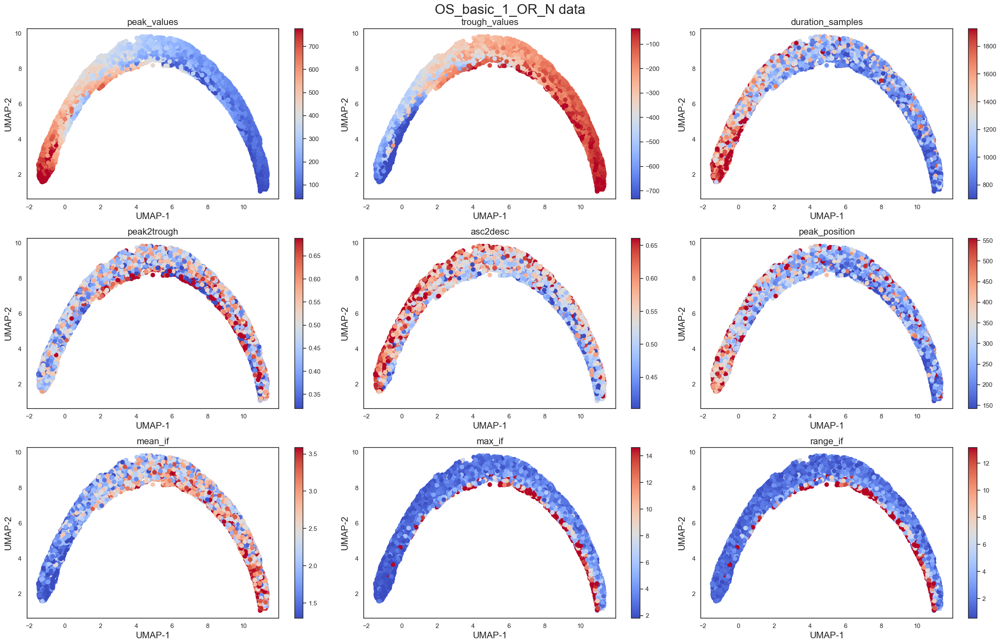

In [22]:
f, ax = plt.subplots(3,3, figsize=(25,16))

features = ['peak_values','trough_values','duration_samples', 'peak2trough', 'asc2desc', 'peak_position', 'mean_if', 'max_if','range_if']
feature_iter = iter(features)

for r in range(3):
    for c in range(3):
        feature = next(feature_iter)
        s = ax[r,c].scatter(emb[:,0], emb[:,1], c=OS_all_trials[feature],
            vmin=np.percentile(OS_all_trials[feature],5),
            vmax=np.percentile(OS_all_trials[feature],95),
            cmap='coolwarm', s=50)
        ax[r,c].set_xlabel('UMAP-1', fontsize=16)
        ax[r,c].set_ylabel('UMAP-2', fontsize=16)
        ax[r,c].set_title(feature, fontsize=16)
        f.colorbar(s, ax=ax[r,c])

plt.suptitle("OS_basic_1_OR_N data", fontsize=24);
f.tight_layout()
# plt.savefig('OS_5_SD4_UMAP1&2.jpg')
# plt.savefig('OS_5_SD4_UMAP1&2.svg')

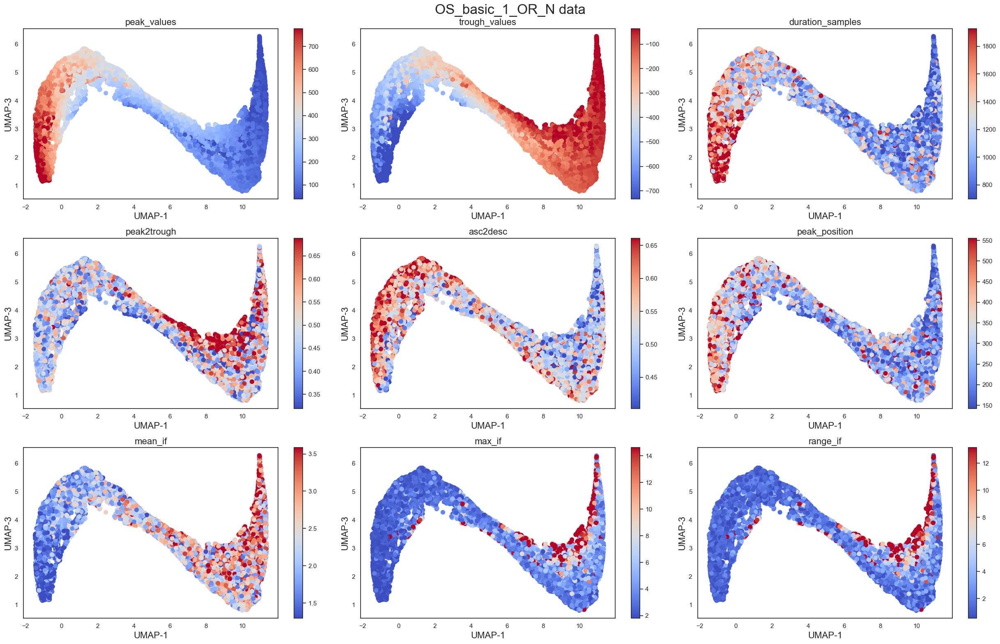

In [23]:
f, ax = plt.subplots(3,3, figsize=(25,16))

features = ['peak_values','trough_values','duration_samples', 'peak2trough', 'asc2desc', 'peak_position', 'mean_if', 'max_if','range_if']
feature_iter = iter(features)

for r in range(3):
    for c in range(3):
        feature = next(feature_iter)
        s = ax[r,c].scatter(emb[:,0], emb[:,2], c=OS_all_trials[feature],
            vmin=np.percentile(OS_all_trials[feature],5),
            vmax=np.percentile(OS_all_trials[feature],95),
            cmap='coolwarm', s=50)
        ax[r,c].set_xlabel('UMAP-1', fontsize=16)
        ax[r,c].set_ylabel('UMAP-3', fontsize=16)
        ax[r,c].set_title(feature, fontsize=16)
        f.colorbar(s, ax=ax[r,c])

plt.suptitle("OS_basic_1_OR_N data", fontsize=24);
f.tight_layout()
# plt.savefig('CBD_5_SD4_UMAP1&3.jpg')
# plt.savefig('CBD_5_SD4_UMAP1&3.svg')

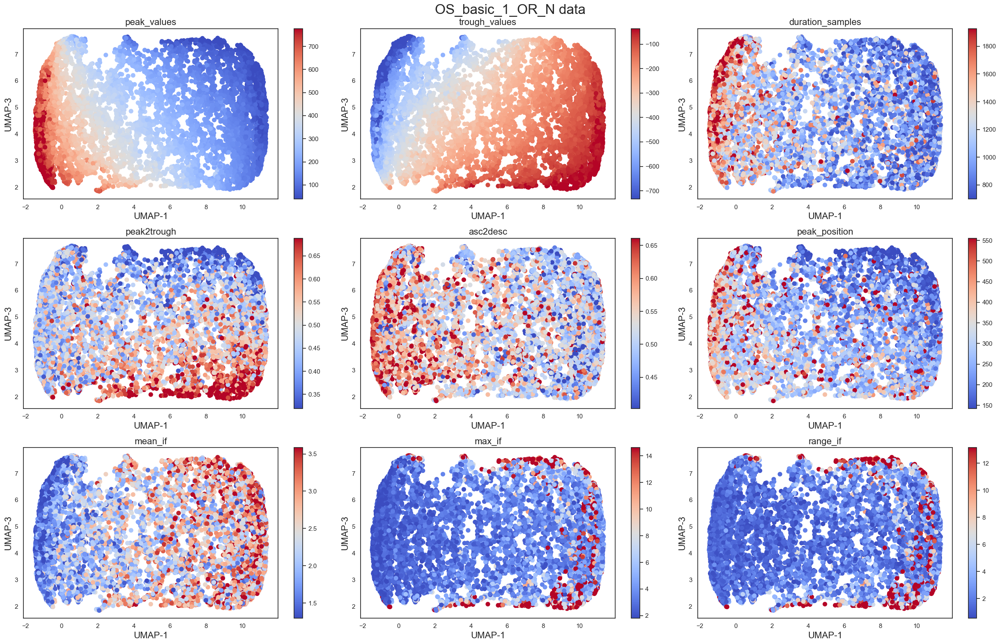

In [26]:
f, ax = plt.subplots(3,3, figsize=(25,16))

features = ['peak_values','trough_values','duration_samples', 'peak2trough', 'asc2desc', 'peak_position', 'mean_if', 'max_if','range_if']
feature_iter = iter(features)

for r in range(3):
    for c in range(3):
        feature = next(feature_iter)
        s = ax[r,c].scatter(emb[:,0], emb[:,3], c=OS_all_trials[feature],
            vmin=np.percentile(OS_all_trials[feature],5),
            vmax=np.percentile(OS_all_trials[feature],95),
            cmap='coolwarm', s=50)
        ax[r,c].set_xlabel('UMAP-1', fontsize=16)
        ax[r,c].set_ylabel('UMAP-3', fontsize=16)
        ax[r,c].set_title(feature, fontsize=16)
        f.colorbar(s, ax=ax[r,c])

plt.suptitle("OS_basic_1_OR_N data", fontsize=24);
f.tight_layout()
# plt.savefig('CBD_5_SD4_UMAP1&3.jpg')
# plt.savefig('CBD_5_SD4_UMAP1&3.svg')

In [28]:
fig = px.scatter_3d(x=emb[:,0], y=emb[:,2], z=emb[:,3],
              color=OS_all_trials['peak_values'])
fig.update_layout(coloraxis_colorbar_title_text = 'peak_values')
fig.show()

# OS_basic_3_OR_N

In [342]:
path_to_data = './data/OS_basic_separated/3/Rat_OS_Ephys_Rat3_SD5_OR_N_21-22_11_2017/'
data_file = 'Cleaned_Trial1_PFC_100_CH49.continuous.mat'
states_file = 'post_trial1_2017-11-21_10-53-58-states.mat'
pfc_data1, sleep_scoring1 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial2_PFC_100_CH49.continuous.mat'
states_file = 'post_trial2_2017-11-21_11-44-35-states.mat'
pfc_data2, sleep_scoring2 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial3_PFC_100_CH49.continuous.mat'
states_file = 'post_trial3_2017-11-21_12-35-06-states.mat'
pfc_data3, sleep_scoring3 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial4_PFC_100_CH49.continuous.mat'
states_file = 'post_trial4_2017-11-21_13-25-29-states.mat'
pfc_data4, sleep_scoring4 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial5_PFC_100_CH49.continuous.mat'
states_file = 'post_trial5_2017-11-21_14-49-47-states.mat'
pfc_data5, sleep_scoring5 = load_mat_data(path_to_data, data_file, states_file)

In [418]:
OS_delta_cycle_data_trial1 = get_delta_cycles(pfc_data1, sleep_scoring1, fs=2500)
OS_delta_cycle_data_trial2 = get_delta_cycles(pfc_data2, sleep_scoring2, fs=2500)
OS_delta_cycle_data_trial3 = get_delta_cycles(pfc_data3, sleep_scoring3, fs=2500)
OS_delta_cycle_data_trial4 = get_delta_cycles(pfc_data4, sleep_scoring4, fs=2500)
OS_delta_cycle_data_trial5 = get_delta_cycles(pfc_data5, sleep_scoring5, fs=2500)

 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'


In [420]:
# metrics1 = OS_delta_cycle_data_trial1['cycles'].get_metric_dataframe()
metrics2 = OS_delta_cycle_data_trial2['cycles'].get_metric_dataframe()
metrics3 = OS_delta_cycle_data_trial3['cycles'].get_metric_dataframe()
metrics4 = OS_delta_cycle_data_trial4['cycles'].get_metric_dataframe()
metrics5 = OS_delta_cycle_data_trial5['cycles'].get_metric_dataframe()

OS_all_trials_metrics = pd.concat([metrics2, metrics3, metrics4, metrics5])

trough = 100
peak = 0
delta_peak = 40

peak_thresh = np.percentile(OS_all_trials_metrics['peak_values'], peak)
trough_thresh = np.percentile(OS_all_trials_metrics['trough_values'], trough)
delta_peak_thresh = np.percentile(OS_all_trials_metrics['peak_values'], delta_peak)

lo_freq_duration = OS_delta_cycle_data_trial5['fs']/0.1
hi_freq_duration = OS_delta_cycle_data_trial5['fs']/4

# Apply conditions to get good cycles
conditions_all_cycles = ['is_good==1',
              f'duration_samples<{lo_freq_duration}',
              f'duration_samples>{hi_freq_duration}',
              f'trough_values<={trough_thresh}']

# OS_all_cycles_trial1 = get_cycles_with_conditions(OS_delta_cycle_data_trial1['cycles'], conditions_all_cycles)
OS_all_cycles_trial2 = get_cycles_with_conditions(OS_delta_cycle_data_trial2['cycles'], conditions_all_cycles)
OS_all_cycles_trial3 = get_cycles_with_conditions(OS_delta_cycle_data_trial3['cycles'], conditions_all_cycles)
OS_all_cycles_trial4 = get_cycles_with_conditions(OS_delta_cycle_data_trial4['cycles'], conditions_all_cycles)
OS_all_cycles_trial5 = get_cycles_with_conditions(OS_delta_cycle_data_trial5['cycles'], conditions_all_cycles)

In [428]:
# OS_all_waveforms_trial1, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial1['IP'], OS_delta_cycle_data_trial1['nrem_filtered_data'],
#                                                             cycles=OS_all_cycles_trial1.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial2, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial2['IP'], OS_delta_cycle_data_trial2['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial2.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial3, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial3['IP'], OS_delta_cycle_data_trial3['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial3.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial4, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial4['IP'], OS_delta_cycle_data_trial4['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial4.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial5, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial5['IP'], OS_delta_cycle_data_trial5['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial5.iterate(through='subset'), npoints=100)

# OS_all_waveforms_trial1 = OS_all_waveforms_trial1.T
OS_all_waveforms_trial2 = OS_all_waveforms_trial2.T
OS_all_waveforms_trial3 = OS_all_waveforms_trial3.T
OS_all_waveforms_trial4 = OS_all_waveforms_trial4.T
OS_all_waveforms_trial5 = OS_all_waveforms_trial5.T

ORN3_all_waveforms = np.vstack((OS_all_waveforms_trial2,
                              OS_all_waveforms_trial3,
                              OS_all_waveforms_trial4,
                              OS_all_waveforms_trial5))

 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'


In [438]:
OS_delta_cycle_data_trial5['cycles'].get_metric_dataframe()

<class 'emd.cycles.Cycles'> (5180 cycles 12 metrics) 

In [430]:
# metrics = OS_all_cycles_trial1.get_metric_dataframe(subset=True)
# OS_trial1 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial1)], axis=1)

metrics = OS_all_cycles_trial2.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial2['IP'], OS_all_cycles_trial2)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial2 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial2)], axis=1)

metrics = OS_all_cycles_trial3.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial3['IP'], OS_all_cycles_trial3)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial3 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial3)], axis=1)

metrics = OS_all_cycles_trial4.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial4['IP'], OS_all_cycles_trial4)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial4 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial4)], axis=1)

metrics = OS_all_cycles_trial5.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial5['IP'], OS_all_cycles_trial5)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial5 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial5)], axis=1)

ORN3_all_trials = pd.concat([OS_trial2, OS_trial3, OS_trial4, OS_trial5])
ORN3_all_trials.columns = ORN3_all_trials.columns.astype('str')
ORN3_all_trials

KeyboardInterrupt: 

# OS_basic_4_OR_N

In [358]:
path_to_data = './data/OS_basic_separated/4/Rat_OS_Ephys_Rat4_SD4_OR_N_18-19_12_2017/'
data_file = 'Cleaned_Trial1_PFC_100_CH34.continuous.mat'
states_file = 'post_trial1_2017-12-18_10-28-46-states.mat'
pfc_data1, sleep_scoring1 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial2_PFC_100_CH34.continuous.mat'
states_file = 'post_trial2_2017-12-18_11-20-02-states.mat'
pfc_data2, sleep_scoring2 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial3_PFC_100_CH34.continuous.mat'
states_file = 'post_trial3_2017-12-18_12-10-35-states.mat'
pfc_data3, sleep_scoring3 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial4_PFC_100_CH34.continuous.mat'
states_file = 'post_trial4_2017-12-18_13-08-50-states.mat'
pfc_data4, sleep_scoring4 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial5_PFC_100_CH34.continuous.mat'
states_file = 'post_trial5_2017-12-18_14-30-11-states.mat'
pfc_data5, sleep_scoring5 = load_mat_data(path_to_data, data_file, states_file)

In [17]:
OS_delta_cycle_data_trial1 = get_delta_cycles(pfc_data1, sleep_scoring1, fs=2500)
OS_delta_cycle_data_trial2 = get_delta_cycles(pfc_data2, sleep_scoring2, fs=2500)
OS_delta_cycle_data_trial3 = get_delta_cycles(pfc_data3, sleep_scoring3, fs=2500)
OS_delta_cycle_data_trial4 = get_delta_cycles(pfc_data4, sleep_scoring4, fs=2500)
OS_delta_cycle_data_trial5 = get_delta_cycles(pfc_data5, sleep_scoring5, fs=2500)

 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'


In [19]:
# metrics1 = OS_delta_cycle_data_trial1['cycles'].get_metric_dataframe()
metrics2 = OS_delta_cycle_data_trial2['cycles'].get_metric_dataframe()
metrics3 = OS_delta_cycle_data_trial3['cycles'].get_metric_dataframe()
metrics4 = OS_delta_cycle_data_trial4['cycles'].get_metric_dataframe()
metrics5 = OS_delta_cycle_data_trial5['cycles'].get_metric_dataframe()

OS_all_trials_metrics = pd.concat([metrics2, metrics3, metrics4, metrics5])

trough = 100
peak = 0
delta_peak = 40

peak_thresh = np.percentile(OS_all_trials_metrics['peak_values'], peak)
trough_thresh = np.percentile(OS_all_trials_metrics['trough_values'], trough)
delta_peak_thresh = np.percentile(OS_all_trials_metrics['peak_values'], delta_peak)

lo_freq_duration = OS_delta_cycle_data_trial5['fs']/0.1
hi_freq_duration = OS_delta_cycle_data_trial5['fs']/4

# Apply conditions to get good cycles
conditions_all_cycles = ['is_good==1',
              f'duration_samples<{lo_freq_duration}',
              f'duration_samples>{hi_freq_duration}',
              f'trough_values<={trough_thresh}']

# OS_all_cycles_trial1 = get_cycles_with_conditions(OS_delta_cycle_data_trial1['cycles'], conditions_all_cycles)
OS_all_cycles_trial2 = get_cycles_with_conditions(OS_delta_cycle_data_trial2['cycles'], conditions_all_cycles)
OS_all_cycles_trial3 = get_cycles_with_conditions(OS_delta_cycle_data_trial3['cycles'], conditions_all_cycles)
OS_all_cycles_trial4 = get_cycles_with_conditions(OS_delta_cycle_data_trial4['cycles'], conditions_all_cycles)
OS_all_cycles_trial5 = get_cycles_with_conditions(OS_delta_cycle_data_trial5['cycles'], conditions_all_cycles)

In [20]:
# OS_all_waveforms_trial1, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial1['IP'], OS_delta_cycle_data_trial1['nrem_filtered_data'],
#                                                             cycles=OS_all_cycles_trial1.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial2, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial2['IP'], OS_delta_cycle_data_trial2['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial2.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial3, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial3['IP'], OS_delta_cycle_data_trial3['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial3.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial4, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial4['IP'], OS_delta_cycle_data_trial4['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial4.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial5, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial5['IP'], OS_delta_cycle_data_trial5['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial5.iterate(through='subset'), npoints=100)

# OS_all_waveforms_trial1 = OS_all_waveforms_trial1.T
OS_all_waveforms_trial2 = OS_all_waveforms_trial2.T
OS_all_waveforms_trial3 = OS_all_waveforms_trial3.T
OS_all_waveforms_trial4 = OS_all_waveforms_trial4.T
OS_all_waveforms_trial5 = OS_all_waveforms_trial5.T

ORN4_all_waveforms = np.vstack((
                              OS_all_waveforms_trial2,
                              OS_all_waveforms_trial3,
                              OS_all_waveforms_trial4,
                              OS_all_waveforms_trial5))

 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'


In [21]:
# metrics = OS_all_cycles_trial1.get_metric_dataframe(subset=True)
# OS_trial1 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial1)], axis=1)

metrics = OS_all_cycles_trial2.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial2['IP'], OS_all_cycles_trial2)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial2 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial2)], axis=1)

metrics = OS_all_cycles_trial3.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial3['IP'], OS_all_cycles_trial3)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial3 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial3)], axis=1)

metrics = OS_all_cycles_trial4.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial4['IP'], OS_all_cycles_trial4)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial4 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial4)], axis=1)

metrics = OS_all_cycles_trial5.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial5['IP'], OS_all_cycles_trial5)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial5 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial5)], axis=1)

ORN4_all_trials = pd.concat([OS_trial2, OS_trial3, OS_trial4, OS_trial5])
ORN4_all_trials.columns = ORN4_all_trials.columns.astype('str')
ORN4_all_trials

,index,is_good,duration_samples,peak2trough,asc2desc,max_amp,trough_values,peak_values,mean_if,max_if,...,90,91,92,93,94,95,96,97,98,99
0,3,1,1091,0.398750,0.524640,170.527753,-97.150422,74.501946,2.292077,5.890751,...,-66.836215,-60.649239,-54.074099,-47.181040,-40.043813,-32.739944,-25.349271,-17.954634,-10.640134,-3.488575
1,5,1,856,0.436831,0.535552,130.292669,-110.343907,84.362026,2.921835,5.003347,...,-73.180037,-66.322361,-59.062117,-51.471860,-43.628472,-35.615943,-27.524488,-19.448535,-11.489188,-3.751605
2,6,1,1354,0.628842,0.652386,117.802776,-65.708890,87.380620,1.846401,3.761842,...,-45.703700,-41.880764,-37.753289,-33.342989,-28.675259,-23.781594,-18.696226,-13.459430,-8.114723,-2.709530
3,8,1,1109,0.509821,0.536369,75.070992,-68.714121,64.875497,2.254408,2.690908,...,-42.123138,-38.200318,-34.080552,-29.791188,-25.360620,-20.820167,-16.204540,-11.549795,-6.894748,-2.279638
4,12,1,983,0.654844,0.558633,92.136685,-28.391048,92.127287,2.542682,4.686282,...,-11.522093,-10.418055,-9.289584,-8.136095,-6.957046,-5.751992,-4.520584,-3.262613,-1.977528,-0.665823
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9179,14691,1,1199,0.346718,0.656936,78.666185,-40.463580,58.687920,2.122187,100.698290,...,-28.130038,-25.832679,-23.346904,-20.683467,-17.854982,-14.874922,-11.757557,-8.518590,-5.174603,-1.742887
9180,14692,1,717,0.653041,0.483468,59.187916,-15.279888,56.651209,3.484595,6.764392,...,-9.074915,-8.395921,-7.664116,-6.874632,-6.022677,-5.103894,-4.112536,-3.043883,-1.892548,-0.653580
9181,14693,1,820,0.649403,0.514197,57.439900,-32.232444,51.791783,3.047335,6.058476,...,-17.365962,-15.929774,-14.414354,-12.814094,-11.125294,-9.342074,-7.459250,-5.470513,-3.370720,-1.153724
9182,14696,1,1251,0.408982,0.585108,63.402200,-43.768492,61.819071,1.999022,2.637211,...,-13.087292,-11.336761,-9.660553,-8.065553,-6.559096,-5.145114,-3.829104,-2.613009,-1.496994,-0.477263


# OS_basic_6_OR_N

In [374]:
path_to_data = './data/OS_basic_separated/6/Study_day7_OR_N_1_2mar2018/'
data_file = 'Cleaned_Trial1_PFC_100_CH33.continuous.mat'
states_file = '2018-03-01_10-34-07_post_trial1-states.mat'
pfc_data1, sleep_scoring1 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial2_PFC_100_CH33.continuous.mat'
states_file = '2018-03-01_11-24-38_post_trial2-states.mat'
pfc_data2, sleep_scoring2 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial3_PFC_100_CH33.continuous.mat'
states_file = '2018-03-01_12-15-12_post_trial3-states.mat'
pfc_data3, sleep_scoring3 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial4_PFC_100_CH33.continuous.mat'
states_file = '2018-03-01_13-05-56_post_trial4-states.mat'
pfc_data4, sleep_scoring4 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial5_PFC_100_CH33.continuous.mat'
states_file = '2018-03-01_14-26-58_post_trial5-states.mat'
pfc_data5, sleep_scoring5 = load_mat_data(path_to_data, data_file, states_file)

In [26]:
OS_delta_cycle_data_trial1 = get_delta_cycles(pfc_data1, sleep_scoring1, fs=2500)
OS_delta_cycle_data_trial2 = get_delta_cycles(pfc_data2, sleep_scoring2, fs=2500)
OS_delta_cycle_data_trial3 = get_delta_cycles(pfc_data3, sleep_scoring3, fs=2500)
OS_delta_cycle_data_trial4 = get_delta_cycles(pfc_data4, sleep_scoring4, fs=2500)
OS_delta_cycle_data_trial5 = get_delta_cycles(pfc_data5, sleep_scoring5, fs=2500)

 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'


In [27]:
metrics1 = OS_delta_cycle_data_trial1['cycles'].get_metric_dataframe()
metrics2 = OS_delta_cycle_data_trial2['cycles'].get_metric_dataframe()
metrics3 = OS_delta_cycle_data_trial3['cycles'].get_metric_dataframe()
metrics4 = OS_delta_cycle_data_trial4['cycles'].get_metric_dataframe()
metrics5 = OS_delta_cycle_data_trial5['cycles'].get_metric_dataframe()

OS_all_trials_metrics = pd.concat([metrics1, metrics2, metrics3, metrics4, metrics5])

trough = 100
peak = 0
delta_peak = 40

peak_thresh = np.percentile(OS_all_trials_metrics['peak_values'], peak)
trough_thresh = np.percentile(OS_all_trials_metrics['trough_values'], trough)
delta_peak_thresh = np.percentile(OS_all_trials_metrics['peak_values'], delta_peak)

lo_freq_duration = OS_delta_cycle_data_trial5['fs']/0.1
hi_freq_duration = OS_delta_cycle_data_trial5['fs']/4

# Apply conditions to get good cycles
conditions_all_cycles = ['is_good==1',
              f'duration_samples<{lo_freq_duration}',
              f'duration_samples>{hi_freq_duration}',
              f'trough_values<={trough_thresh}']

OS_all_cycles_trial1 = get_cycles_with_conditions(OS_delta_cycle_data_trial1['cycles'], conditions_all_cycles)
OS_all_cycles_trial2 = get_cycles_with_conditions(OS_delta_cycle_data_trial2['cycles'], conditions_all_cycles)
OS_all_cycles_trial3 = get_cycles_with_conditions(OS_delta_cycle_data_trial3['cycles'], conditions_all_cycles)
OS_all_cycles_trial4 = get_cycles_with_conditions(OS_delta_cycle_data_trial4['cycles'], conditions_all_cycles)
OS_all_cycles_trial5 = get_cycles_with_conditions(OS_delta_cycle_data_trial5['cycles'], conditions_all_cycles)

In [28]:
OS_all_waveforms_trial1, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial1['IP'], OS_delta_cycle_data_trial1['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial1.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial2, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial2['IP'], OS_delta_cycle_data_trial2['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial2.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial3, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial3['IP'], OS_delta_cycle_data_trial3['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial3.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial4, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial4['IP'], OS_delta_cycle_data_trial4['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial4.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial5, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial5['IP'], OS_delta_cycle_data_trial5['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial5.iterate(through='subset'), npoints=100)

OS_all_waveforms_trial1 = OS_all_waveforms_trial1.T
OS_all_waveforms_trial2 = OS_all_waveforms_trial2.T
OS_all_waveforms_trial3 = OS_all_waveforms_trial3.T
OS_all_waveforms_trial4 = OS_all_waveforms_trial4.T
OS_all_waveforms_trial5 = OS_all_waveforms_trial5.T

ORN6_all_waveforms = np.vstack((OS_all_waveforms_trial1,
                              OS_all_waveforms_trial2,
                              OS_all_waveforms_trial3,
                              OS_all_waveforms_trial4,
                              OS_all_waveforms_trial5))

 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'


In [29]:
metrics = OS_all_cycles_trial1.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial1['IP'], OS_all_cycles_trial1)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial1 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial1)], axis=1)

metrics = OS_all_cycles_trial2.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial2['IP'], OS_all_cycles_trial2)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial2 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial2)], axis=1)

metrics = OS_all_cycles_trial3.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial3['IP'], OS_all_cycles_trial3)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial3 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial3)], axis=1)

metrics = OS_all_cycles_trial4.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial4['IP'], OS_all_cycles_trial4)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial4 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial4)], axis=1)

metrics = OS_all_cycles_trial5.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial5['IP'], OS_all_cycles_trial5)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial5 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial5)], axis=1)

ORN6_all_trials = pd.concat([OS_trial1, OS_trial2, OS_trial3, OS_trial4, OS_trial5])
ORN6_all_trials.columns = ORN6_all_trials.columns.astype('str')
ORN6_all_trials

,index,is_good,duration_samples,peak2trough,asc2desc,max_amp,trough_values,peak_values,mean_if,max_if,...,90,91,92,93,94,95,96,97,98,99
0,1,1,1077,0.708889,0.492222,153.150135,-42.870467,152.520441,2.321281,5.487421,...,-26.612017,-24.662317,-22.545923,-20.249276,-17.759365,-15.062896,-12.142027,-8.988916,-5.587651,-1.928505
1,2,1,1507,0.617006,0.366118,213.362688,-154.191526,117.888410,1.660009,3.043166,...,-106.895026,-98.169506,-88.752924,-78.673931,-67.966069,-56.672956,-44.841138,-32.523436,-19.778018,-6.668879
2,3,1,743,0.704268,0.471038,226.695035,-41.204131,209.488751,3.363717,8.867283,...,-33.703160,-31.949123,-29.892494,-27.487082,-24.689112,-21.446394,-17.710728,-13.428763,-8.546965,-3.019657
3,4,1,1037,0.576038,0.546243,308.473541,-205.303884,280.115521,2.409000,3.257636,...,-104.728836,-95.191193,-85.297878,-75.051506,-64.454021,-53.507288,-42.213413,-30.575101,-18.596025,-6.281221
4,5,1,968,0.531291,0.536390,427.732661,-394.482371,337.495630,2.583949,2.987354,...,-199.248842,-179.397830,-159.090640,-138.403492,-117.414723,-96.199806,-74.836749,-53.402367,-31.972425,-10.622097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8338,15520,1,879,0.403326,0.564576,158.699490,-77.725586,96.893225,2.843650,4.906436,...,-51.042879,-46.536089,-41.785265,-36.824066,-31.682403,-26.380135,-20.918629,-15.273350,-9.394167,-3.217705
8339,15521,1,1040,0.569709,0.589916,157.093255,-106.880398,156.856273,2.402447,3.030155,...,-52.472405,-47.118522,-41.658650,-36.118389,-30.523946,-24.902134,-19.280053,-13.685208,-8.145611,-2.688811
8340,15523,1,841,0.629069,0.510051,136.385811,-40.047478,135.816629,2.968269,8.254713,...,-9.683171,-8.665229,-7.654410,-6.648205,-5.642997,-4.636281,-3.624455,-2.604912,-1.573937,-0.528746
8341,15526,1,694,0.433083,0.529977,237.860029,-69.395155,102.456231,3.602233,6.645382,...,-39.276193,-35.041668,-30.707932,-26.321309,-21.931345,-17.588195,-13.342319,-9.245557,-5.349387,-1.707964


# OS_basic_13_OR_N

In [386]:
path_to_data = './data/OS_basic_separated/13/Rat_OS_Ephys_Rat13_344994_SD11_OR_N_06-07_06_2019/'
data_file = 'Cleaned_Trial1_PFC_100_CH63_0.continuous.mat'
states_file = '2019-06-06_11-44-01_post_trial1-states.mat'
pfc_data1, sleep_scoring1 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial2_PFC_100_CH63_0.continuous.mat'
states_file = '2019-06-06_12-34-54_post_trial2-states.mat'
pfc_data2, sleep_scoring2 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial3_PFC_100_CH63_0.continuous.mat'
states_file = '2019-06-06_13-26-20_post_trial3-states.mat'
pfc_data3, sleep_scoring3 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial4_PFC_100_CH63_0.continuous.mat'
states_file = '2019-06-06_14-17-32_post_trial4-states.mat'
pfc_data4, sleep_scoring4 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial5_PFC_100_CH63_0.continuous.mat'
states_file = '2019-06-06_15-39-11_post_trial5-states.mat'
pfc_data5, sleep_scoring5 = load_mat_data(path_to_data, data_file, states_file)

In [58]:
OS_delta_cycle_data_trial1 = get_delta_cycles(pfc_data1, sleep_scoring1, fs=2500)
OS_delta_cycle_data_trial2 = get_delta_cycles(pfc_data2, sleep_scoring2, fs=2500)
OS_delta_cycle_data_trial3 = get_delta_cycles(pfc_data3, sleep_scoring3, fs=2500)
OS_delta_cycle_data_trial4 = get_delta_cycles(pfc_data4, sleep_scoring4, fs=2500)
OS_delta_cycle_data_trial5 = get_delta_cycles(pfc_data5, sleep_scoring5, fs=2500)

 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'


In [60]:
metrics1 = OS_delta_cycle_data_trial1['cycles'].get_metric_dataframe()
metrics2 = OS_delta_cycle_data_trial2['cycles'].get_metric_dataframe()
metrics3 = OS_delta_cycle_data_trial3['cycles'].get_metric_dataframe()
metrics4 = OS_delta_cycle_data_trial4['cycles'].get_metric_dataframe()
metrics5 = OS_delta_cycle_data_trial5['cycles'].get_metric_dataframe()

OS_all_trials_metrics = pd.concat([metrics1, metrics2, metrics3, metrics4, metrics5])

trough = 100
peak = 0
delta_peak = 40

peak_thresh = np.percentile(OS_all_trials_metrics['peak_values'], peak)
trough_thresh = np.percentile(OS_all_trials_metrics['trough_values'], trough)
delta_peak_thresh = np.percentile(OS_all_trials_metrics['peak_values'], delta_peak)

lo_freq_duration = OS_delta_cycle_data_trial5['fs']/0.1
hi_freq_duration = OS_delta_cycle_data_trial5['fs']/4

# Apply conditions to get good cycles
conditions_all_cycles = ['is_good==1',
              f'duration_samples<{lo_freq_duration}',
              f'duration_samples>{hi_freq_duration}',
              f'trough_values<={trough_thresh}']

OS_all_cycles_trial1 = get_cycles_with_conditions(OS_delta_cycle_data_trial1['cycles'], conditions_all_cycles)
OS_all_cycles_trial2 = get_cycles_with_conditions(OS_delta_cycle_data_trial2['cycles'], conditions_all_cycles)
OS_all_cycles_trial3 = get_cycles_with_conditions(OS_delta_cycle_data_trial3['cycles'], conditions_all_cycles)
OS_all_cycles_trial4 = get_cycles_with_conditions(OS_delta_cycle_data_trial4['cycles'], conditions_all_cycles)
OS_all_cycles_trial5 = get_cycles_with_conditions(OS_delta_cycle_data_trial5['cycles'], conditions_all_cycles)

In [61]:
OS_all_waveforms_trial1, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial1['IP'], OS_delta_cycle_data_trial1['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial1.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial2, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial2['IP'], OS_delta_cycle_data_trial2['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial2.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial3, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial3['IP'], OS_delta_cycle_data_trial3['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial3.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial4, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial4['IP'], OS_delta_cycle_data_trial4['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial4.iterate(through='subset'), npoints=100)
OS_all_waveforms_trial5, _ = emd.cycles.phase_align(OS_delta_cycle_data_trial5['IP'], OS_delta_cycle_data_trial5['nrem_filtered_data'],
                                                            cycles=OS_all_cycles_trial5.iterate(through='subset'), npoints=100)

OS_all_waveforms_trial1 = OS_all_waveforms_trial1.T
OS_all_waveforms_trial2 = OS_all_waveforms_trial2.T
OS_all_waveforms_trial3 = OS_all_waveforms_trial3.T
OS_all_waveforms_trial4 = OS_all_waveforms_trial4.T
OS_all_waveforms_trial5 = OS_all_waveforms_trial5.T

ORN13_all_waveforms = np.vstack((OS_all_waveforms_trial1,
                              OS_all_waveforms_trial2,
                              OS_all_waveforms_trial3,
                              OS_all_waveforms_trial4,
                              OS_all_waveforms_trial5))

 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'
 Checking phase_align inputs - trimming singleton from input 'ip'


In [62]:
metrics = OS_all_cycles_trial1.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial1['IP'], OS_all_cycles_trial1)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial1 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial1)], axis=1)

metrics = OS_all_cycles_trial2.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial2['IP'], OS_all_cycles_trial2)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial2 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial2)], axis=1)

metrics = OS_all_cycles_trial3.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial3['IP'], OS_all_cycles_trial3)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial3 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial3)], axis=1)

metrics = OS_all_cycles_trial4.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial4['IP'], OS_all_cycles_trial4)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial4 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial4)], axis=1)

metrics = OS_all_cycles_trial5.get_metric_dataframe(subset=True)
cycle_vector = get_masked_cycles(OS_delta_cycle_data_trial5['IP'], OS_all_cycles_trial5)
metrics['cycle_position'] = metrics.apply(get_cycle_position, cycle_vector=cycle_vector, fs=2500, axis=1)
OS_trial5 = pd.concat([metrics, pd.DataFrame(OS_all_waveforms_trial5)], axis=1)

ORN13_all_trials = pd.concat([OS_trial1, OS_trial2, OS_trial3, OS_trial4, OS_trial5])
ORN13_all_trials.columns = ORN13_all_trials.columns.astype('str')
ORN13_all_trials

,index,is_good,duration_samples,peak2trough,asc2desc,max_amp,trough_values,peak_values,mean_if,max_if,...,90,91,92,93,94,95,96,97,98,99
0,3,1,888,0.135392,0.459008,196.507790,-170.206004,4.098828,2.815243,487.034032,...,-109.920019,-98.940025,-87.487544,-75.695281,-63.697677,-51.631000,-39.630153,-27.827240,-16.349100,-5.315360
1,4,1,777,0.500177,0.484071,166.656075,-86.482198,64.205988,3.215732,17.909827,...,-70.077246,-64.666420,-58.609777,-51.972939,-44.827397,-37.248004,-29.319040,-21.120302,-12.738245,-4.254213
2,5,1,889,0.399334,0.539339,188.313452,-174.292307,101.556720,2.813268,4.547034,...,-104.066260,-93.334433,-82.236505,-70.890005,-59.418818,-47.950738,-36.618826,-25.559209,-14.908207,-4.803904
3,12,1,770,0.503358,0.505548,73.702837,-61.611008,34.253805,3.263164,29.685259,...,-37.076578,-33.894013,-30.530477,-26.991500,-23.279462,-19.399205,-15.355201,-11.153045,-6.799051,-2.300708
4,15,1,777,0.442689,0.503802,268.710203,-229.034922,128.915435,3.219608,3.926326,...,-145.467822,-132.487501,-118.783009,-104.414890,-89.455768,-73.976411,-58.054303,-41.767394,-25.198819,-8.431436
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3738,7992,1,899,0.524784,0.536467,97.428790,-87.736861,51.630056,2.804935,68.162273,...,-43.349759,-39.152276,-34.850149,-30.450109,-25.962158,-21.393001,-16.747692,-12.035034,-7.261293,-2.432607
3739,7994,1,1209,0.406684,0.376542,97.452156,-41.637628,88.483164,2.067879,13.549942,...,-6.877865,-6.008476,-5.186029,-4.408597,-3.665642,-2.952619,-2.265094,-1.598811,-0.949746,-0.314128
3740,7995,1,938,0.371507,0.528215,119.609368,-105.328342,44.421326,2.665340,13.903288,...,-31.339665,-27.145990,-23.161141,-19.385692,-15.826393,-12.483832,-9.354488,-6.436859,-3.718832,-1.193959
3741,7997,1,917,0.369437,0.514155,151.910693,-146.821253,52.386708,2.720722,14.294990,...,-63.514149,-56.354054,-49.232891,-42.185167,-35.241782,-28.427004,-21.771107,-15.295239,-9.015514,-2.949332


# Save all data

In [157]:
all_orn_data['ORN1_trials'] = ORN1_all_trials
all_orn_data['ORN1_waveforms'] = ORN1_all_waveforms

In [ ]:
all_orn_data = {'ORN1_trials': ORN1_all_trials,
                'ORN1_waveforms': ORN1_all_waveforms,
                'ORN3_trials': ORN3_all_trials,
                'ORN3_waveforms': ORN3_all_waveforms,
                'ORN4_trials': ORN4_all_trials,
                'ORN4_waveforms': ORN4_all_waveforms,
                'ORN6_trials': ORN6_all_trials,
                'ORN6_waveforms': ORN6_all_waveforms,
                'ORN13_trials': ORN13_all_trials,
                'ORN13_waveforms': ORN13_all_waveforms}

In [328]:
with open('all_orn_data.pkl', 'wb') as outp:
    pickle.dump(all_orn_data, outp)

In [3]:
with open('all_orn_data.pkl', 'rb') as file:
    all_orn_data = pickle.load(file)

In [4]:
all_orn_data.keys()

dict_keys(['ORN1_trials', 'ORN1_waveforms', 'ORN3_trials', 'ORN3_waveforms', 'ORN4_trials', 'ORN4_waveforms', 'ORN6_trials', 'ORN6_waveforms', 'ORN13_trials', 'ORN13_waveforms'])

# Intrinsic Dimension

In [332]:
def abids(X,k):
    search_struct = cKDTree(X)
    return np.array([abid(X,k,x,search_struct) for x in X])


def abid(X,k,x,search_struct,offset=1):
    neighbor_norms, neighbors = search_struct.query(x,k+offset)
    neighbors = X[neighbors[offset:]] - x
    normed_neighbors = neighbors / neighbor_norms[offset:,None]
    # Original publication version that computes all cosines
    # coss = normed_neighbors.dot(normed_neighbors.T)
    # return np.mean(np.square(coss))**-1
    # Using another product to get the same values with less effort
    para_coss = normed_neighbors.T.dot(normed_neighbors)
    return k**2 / np.sum(np.square(para_coss))

waveforms = all_orn_data['ORN1_waveforms']
ID = np.round(np.nanmean(abids(waveforms, 50)))
ID

4.0

In [31]:
# ORN1: 4, length: 10689
# ORN3: 3, length: 1579
# ORN4: 4, length: 13380
# ORN6: 4, length: 15649
# ORN13: 3, length: 8330

# UMAP

In [9]:
data = all_orn_data['ORN1_trials']
# data = data[data['trial'] == 5]

waveforms = all_orn_data['ORN1_waveforms']
# waveforms = waveforms[waveforms['trial'] == 5]
# waveforms = np.array(waveforms.drop('trial', axis=1))

In [21]:
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=4, metric='euclidean', random_state=42)
embedding = umap_embedder.fit(waveforms)
emb = embedding.embedding_

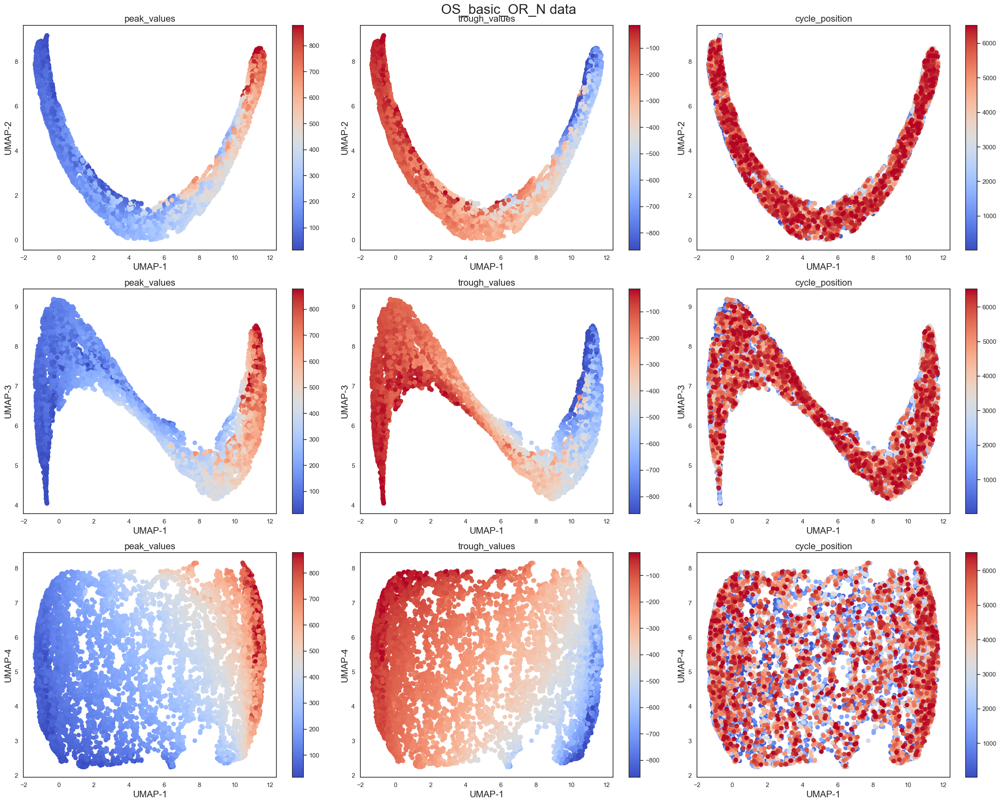

In [22]:
f, ax = plt.subplots(3,3, figsize=(25,20))
s = ax[0,0].scatter(emb[:,0], emb[:,1], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[0,0].set_xlabel('UMAP-1', fontsize=16)
ax[0,0].set_ylabel('UMAP-2', fontsize=16)
ax[0,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[0,0])

s = ax[0,1].scatter(emb[:,0], emb[:,1], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[0,1].set_xlabel('UMAP-1', fontsize=16)
ax[0,1].set_ylabel('UMAP-2', fontsize=16)
ax[0,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[0,1])

s = ax[0,2].scatter(emb[:,0], emb[:,1], c=data['cycle_position'],
            vmin=np.percentile(data['cycle_position'],1),
            vmax=np.percentile(data['cycle_position'],99),
            cmap='coolwarm', s=50)
ax[0,2].set_xlabel('UMAP-1', fontsize=16)
ax[0,2].set_ylabel('UMAP-2', fontsize=16)
ax[0,2].set_title('cycle_position', fontsize=16)
f.colorbar(s, ax=ax[0,2])
####################################################################

s = ax[1,0].scatter(emb[:,0], emb[:,2], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[1,0].set_xlabel('UMAP-1', fontsize=16)
ax[1,0].set_ylabel('UMAP-3', fontsize=16)
ax[1,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[1,0])

s = ax[1,1].scatter(emb[:,0], emb[:,2], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[1,1].set_xlabel('UMAP-1', fontsize=16)
ax[1,1].set_ylabel('UMAP-3', fontsize=16)
ax[1,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[1,1])

s = ax[1,2].scatter(emb[:,0], emb[:,2], c=data['cycle_position'],
            vmin=np.percentile(data['cycle_position'],1),
            vmax=np.percentile(data['cycle_position'],99),
            cmap='coolwarm', s=50)
ax[1,2].set_xlabel('UMAP-1', fontsize=16)
ax[1,2].set_ylabel('UMAP-3', fontsize=16)
ax[1,2].set_title('cycle_position', fontsize=16)
f.colorbar(s, ax=ax[1,2])
####################################################################

s = ax[2,0].scatter(emb[:,0], emb[:,3], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[2,0].set_xlabel('UMAP-1', fontsize=16)
ax[2,0].set_ylabel('UMAP-4', fontsize=16)
ax[2,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[2,0])

s = ax[2,1].scatter(emb[:,0], emb[:,3], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[2,1].set_xlabel('UMAP-1', fontsize=16)
ax[2,1].set_ylabel('UMAP-4', fontsize=16)
ax[2,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[2,1])

s = ax[2,2].scatter(emb[:,0], emb[:,3], c=data['cycle_position'],
            vmin=np.percentile(data['cycle_position'],1),
            vmax=np.percentile(data['cycle_position'],99),
            cmap='coolwarm', s=50)
ax[2,2].set_xlabel('UMAP-1', fontsize=16)
ax[2,2].set_ylabel('UMAP-4', fontsize=16)
ax[2,2].set_title('cycle_position', fontsize=16)
f.colorbar(s, ax=ax[2,2])
####################################################################

plt.suptitle("OS_basic_OR_N data", fontsize=24);
f.tight_layout()
# plt.savefig('./plots_11_09_2024/1_OR_N_UMAP_cycle_position.jpg')

### Waveforms from Extremes of UMAP

In [391]:
emb_data = pd.DataFrame(embedding.embedding_)
low_embeddings = emb_data[(emb_data[0] >= np.percentile(emb_data[0], 1)) & (emb_data[0] <= np.percentile(emb_data[0], 15))]
low_waveforms = np.array(pd.DataFrame(all_orn_data['ORN13_waveforms']).iloc[low_embeddings.index])

In [393]:
emb_data = pd.DataFrame(embedding.embedding_)
high_embeddings = emb_data[(emb_data[0] >= np.percentile(emb_data[0], 85)) & (emb_data[0] <= np.percentile(emb_data[0], 99))]
high_waveforms = np.array(pd.DataFrame(all_orn_data['ORN13_waveforms']).iloc[high_embeddings.index])

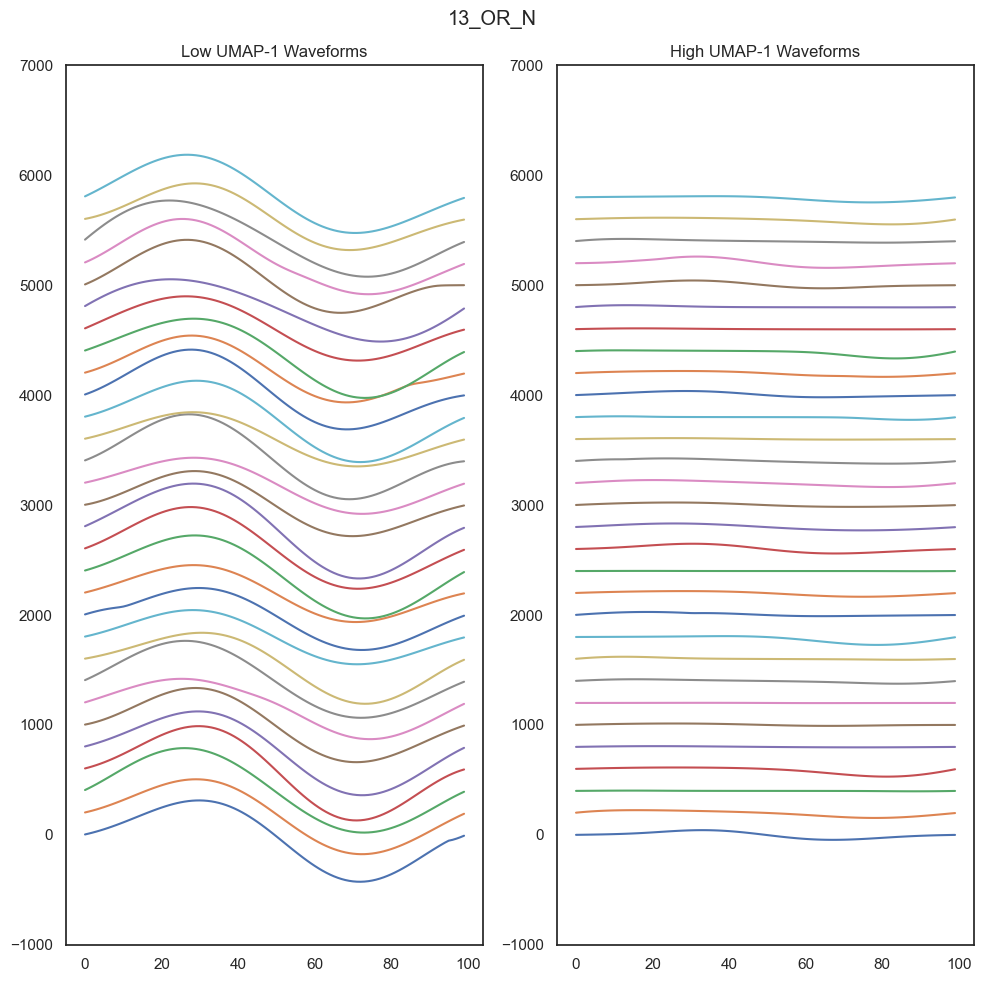

In [395]:
plt.figure(figsize=(8,8), facecolor='white')
plt.suptitle("13_OR_N")
plt.subplot(1, 2, 1)
plt.title('Low UMAP-1 Waveforms')
start = 0
cycles_to_plot = np.random.randint(1, low_waveforms.shape[0], 30)
for i in cycles_to_plot:
  plt.plot(low_waveforms[i,:]+start)
  start += 200
plt.ylim((-1000, 7000))

plt.subplot(1, 2, 2)
plt.title('High UMAP-1 Waveforms')
start = 0
cycles_to_plot = np.random.randint(1, high_waveforms.shape[0], 30)
for i in cycles_to_plot:
  plt.plot(high_waveforms[i,:]+start)
  start += 200
plt.ylim((-1000, 7000))

plt.tight_layout()
# plt.savefig('./plots_11_09_2024/13_OR_N_extreme_waveforms_UMAP-1.jpg')

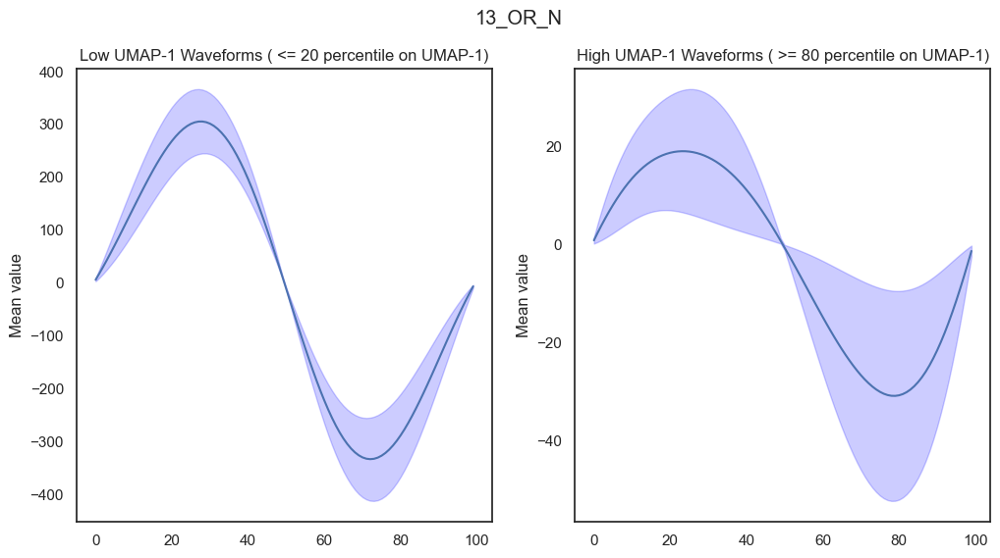

In [397]:
# Average waveforms
plt.figure(figsize=(12,6), facecolor='white')
plt.suptitle("13_OR_N")
plt.subplot(1, 2, 1)

x_values = np.arange(len(means))
means = np.mean(low_waveforms, axis=0)
std = np.std(low_waveforms, axis=0)
lower_bound = np.array(means) - np.array(std)
upper_bound = np.array(means) + np.array(std)
sns.lineplot(means)
plt.fill_between(x_values, lower_bound, upper_bound, color='blue', alpha=0.2)
plt.ylabel('Mean value')
plt.title('Low UMAP-1 Waveforms ( <= 20 percentile on UMAP-1)');

plt.subplot(1, 2, 2)
means = np.mean(high_waveforms, axis=0)
std = np.std(high_waveforms, axis=0)
lower_bound = np.array(means) - np.array(std)
upper_bound = np.array(means) + np.array(std)
sns.lineplot(means)
plt.fill_between(x_values, lower_bound, upper_bound, color='blue', alpha=0.2);
plt.ylabel('Mean value')
plt.title('High UMAP-1 Waveforms ( >= 80 percentile on UMAP-1)');
# plt.savefig('./plots_18_09_2024/13_OR_N_average_waveforms_UMAP-1.jpg')

### Other plots

In [ ]:
data = all_orn_data['ORN13_trials']

f, ax = plt.subplots(2,2, figsize=(25,20))
s = ax[0,0].scatter(emb[:,0], emb[:,1], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[0,0].set_xlabel('UMAP-1', fontsize=16)
ax[0,0].set_ylabel('UMAP-2', fontsize=16)
ax[0,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[0,0])

s = ax[0,1].scatter(emb[:,0], emb[:,1], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[0,1].set_xlabel('UMAP-1', fontsize=16)
ax[0,1].set_ylabel('UMAP-2', fontsize=16)
ax[0,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[0,1])

s = ax[1,0].scatter(emb[:,0], emb[:,2], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[1,0].set_xlabel('UMAP-1', fontsize=16)
ax[1,0].set_ylabel('UMAP-3', fontsize=16)
ax[1,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[1,0])

s = ax[1,1].scatter(emb[:,0], emb[:,2], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[1,1].set_xlabel('UMAP-1', fontsize=16)
ax[1,1].set_ylabel('UMAP-3', fontsize=16)
ax[1,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[1,1])

plt.suptitle("OS_basic_13_OR_N data", fontsize=24);
f.tight_layout()
plt.savefig('./plots_11_09_2024/13_OR_N_UMAP.jpg')

In [ ]:
fig = px.scatter_3d(x=emb[:,1], y=emb[:,2], z=emb[:,3],
              color=all_orn_data['ORN6_trials']['cycle_position'])
fig.update_layout(coloraxis_colorbar_title_text = 'peak_values')
fig.show()

In [ ]:
f, ax = plt.subplots(3,3, figsize=(25,16))

features = ['peak_values','trough_values','duration_samples', 'peak2trough', 'asc2desc', 'peak_position', 'mean_if', 'max_if','range_if']
feature_iter = iter(features)

for r in range(3):
    for c in range(3):
        feature = next(feature_iter)
        s = ax[r,c].scatter(emb[:,0], emb[:,2], c=all_orn_data['ORN13_trials'][feature],
            vmin=np.percentile(all_orn_data['ORN13_trials'][feature],1),
            vmax=np.percentile(all_orn_data['ORN13_trials'][feature],99),
            cmap='coolwarm', s=50)
        ax[r,c].set_xlabel('UMAP-1', fontsize=16)
        ax[r,c].set_ylabel('UMAP-3', fontsize=16)
        ax[r,c].set_title(feature, fontsize=16)
        f.colorbar(s, ax=ax[r,c])

plt.suptitle("OS_basic_13_OR_N data", fontsize=24);
f.tight_layout()
# plt.savefig('./plots_11_09_2024/13_OR_N_UMAP1&3.jpg')

In [ ]:
f, ax = plt.subplots(3,3, figsize=(25,16))

features = ['peak_values','trough_values','duration_samples', 'peak2trough', 'asc2desc', 'peak_position', 'mean_if', 'max_if','range_if']
feature_iter = iter(features)

for r in range(3):
    for c in range(3):
        feature = next(feature_iter)
        s = ax[r,c].scatter(emb[:,0], emb[:,3], c=all_orn_data['ORN13_trials'][feature],
            vmin=np.percentile(all_orn_data['ORN13_trials'][feature],1),
            vmax=np.percentile(all_orn_data['ORN13_trials'][feature],99),
            cmap='coolwarm', s=50)
        ax[r,c].set_xlabel('UMAP-1', fontsize=16)
        ax[r,c].set_ylabel('UMAP-4', fontsize=16)
        ax[r,c].set_title(feature, fontsize=16)
        f.colorbar(s, ax=ax[r,c])

plt.suptitle("OS_basic_13_OR_N data", fontsize=24);
f.tight_layout()
# plt.savefig('./plots_11_09_2024/13_OR_N_UMAP1&4.jpg')

# All ORN Combined

In [9]:
all_orn_data.keys()

dict_keys(['ORN1_trials', 'ORN1_waveforms', 'ORN3_trials', 'ORN3_waveforms', 'ORN4_trials', 'ORN4_waveforms', 'ORN6_trials', 'ORN6_waveforms', 'ORN13_trials', 'ORN13_waveforms'])

In [11]:
combined_trials_data = pd.concat([all_orn_data['ORN1_trials'],
                                  all_orn_data['ORN3_trials'],
                                  all_orn_data['ORN4_trials'],
                                  all_orn_data['ORN6_trials'],
                                  all_orn_data['ORN13_trials']])

In [13]:
combined_waveform_data = np.vstack([all_orn_data['ORN1_waveforms'],
                                    all_orn_data['ORN3_waveforms'],
                                    all_orn_data['ORN4_waveforms'],
                                    all_orn_data['ORN6_waveforms'],
                                    all_orn_data['ORN13_waveforms']])

In [15]:
combined_waveform_data.shape

(49627, 100)

In [17]:
combined_trials_data

,index,is_good,duration_samples,peak2trough,asc2desc,max_amp,trough_values,peak_values,mean_if,max_if,...,90,91,92,93,94,95,96,97,98,99
0,1,1,969,0.550307,0.519676,108.156481,-77.993839,106.960430,2.579322,2.932432,...,-39.892808,-35.931067,-31.871764,-27.731186,-23.523818,-19.268632,-14.984527,-10.687082,-6.393567,-2.122224
1,2,1,817,0.486685,0.472428,135.644429,-87.063017,58.600625,3.059675,3.461831,...,-63.867486,-59.006583,-53.672944,-47.875965,-41.626575,-34.939250,-27.832377,-20.327441,-12.449542,-4.228669
2,3,1,1109,0.501800,0.494698,183.877850,-153.130626,180.234984,2.254350,2.581014,...,-79.695037,-71.896991,-63.882848,-55.683068,-47.328228,-38.849598,-30.278379,-21.645794,-12.982993,-4.321066
3,4,1,1049,0.468853,0.538484,137.364191,-96.724948,132.315742,2.383435,2.623497,...,-37.755499,-33.363139,-29.028456,-24.770686,-20.607243,-16.554223,-12.626006,-8.833156,-5.185202,-1.689251
4,5,1,872,0.548948,0.495442,74.146697,-60.298726,38.647919,2.865991,3.427340,...,-38.181774,-34.879888,-31.383215,-27.700030,-23.841866,-19.819569,-15.643375,-11.326371,-6.880930,-2.319635
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3738,7992,1,899,0.524784,0.536467,97.428790,-87.736861,51.630056,2.804935,68.162273,...,-43.349759,-39.152276,-34.850149,-30.450109,-25.962158,-21.393001,-16.747692,-12.035034,-7.261293,-2.432607
3739,7994,1,1209,0.406684,0.376542,97.452156,-41.637628,88.483164,2.067879,13.549942,...,-6.877865,-6.008476,-5.186029,-4.408597,-3.665642,-2.952619,-2.265094,-1.598811,-0.949746,-0.314128
3740,7995,1,938,0.371507,0.528215,119.609368,-105.328342,44.421326,2.665340,13.903288,...,-31.339665,-27.145990,-23.161141,-19.385692,-15.826393,-12.483832,-9.354488,-6.436859,-3.718832,-1.193959
3741,7997,1,917,0.369437,0.514155,151.910693,-146.821253,52.386708,2.720722,14.294990,...,-63.514149,-56.354054,-49.232891,-42.185167,-35.241782,-28.427004,-21.771107,-15.295239,-9.015514,-2.949332


In [19]:
def abids(X,k):
    search_struct = cKDTree(X)
    return np.array([abid(X,k,x,search_struct) for x in X])


def abid(X,k,x,search_struct,offset=1):
    neighbor_norms, neighbors = search_struct.query(x,k+offset)
    neighbors = X[neighbors[offset:]] - x
    normed_neighbors = neighbors / neighbor_norms[offset:,None]
    # Original publication version that computes all cosines
    # coss = normed_neighbors.dot(normed_neighbors.T)
    # return np.mean(np.square(coss))**-1
    # Using another product to get the same values with less effort
    para_coss = normed_neighbors.T.dot(normed_neighbors)
    return k**2 / np.sum(np.square(para_coss))

ID = np.round(np.nanmean(abids(combined_waveform_data, 50)))
ID

4.0

In [27]:
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=4, metric='euclidean', random_state=42)
embedding = umap_embedder.fit(combined_waveform_data)
emb = embedding.embedding_

In [ ]:
data = combined_trials_data

f, ax = plt.subplots(3,3, figsize=(25,20))
s = ax[0,0].scatter(emb[:,0], emb[:,1], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[0,0].set_xlabel('UMAP-1', fontsize=16)
ax[0,0].set_ylabel('UMAP-2', fontsize=16)
ax[0,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[0,0])

s = ax[0,1].scatter(emb[:,0], emb[:,1], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[0,1].set_xlabel('UMAP-1', fontsize=16)
ax[0,1].set_ylabel('UMAP-2', fontsize=16)
ax[0,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[0,1])

s = ax[0,2].scatter(emb[:,0], emb[:,1], c=data['duration_samples'],
            vmin=np.percentile(data['duration_samples'],1),
            vmax=np.percentile(data['duration_samples'],99),
            cmap='coolwarm', s=50)
ax[0,2].set_xlabel('UMAP-1', fontsize=16)
ax[0,2].set_ylabel('UMAP-2', fontsize=16)
ax[0,2].set_title('duration_samples', fontsize=16)
f.colorbar(s, ax=ax[0,2])
####################################################################

s = ax[1,0].scatter(emb[:,0], emb[:,2], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[1,0].set_xlabel('UMAP-1', fontsize=16)
ax[1,0].set_ylabel('UMAP-3', fontsize=16)
ax[1,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[1,0])

s = ax[1,1].scatter(emb[:,0], emb[:,2], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[1,1].set_xlabel('UMAP-1', fontsize=16)
ax[1,1].set_ylabel('UMAP-3', fontsize=16)
ax[1,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[1,1])

s = ax[1,2].scatter(emb[:,0], emb[:,2], c=data['duration_samples'],
            vmin=np.percentile(data['duration_samples'],1),
            vmax=np.percentile(data['duration_samples'],99),
            cmap='coolwarm', s=50)
ax[1,2].set_xlabel('UMAP-1', fontsize=16)
ax[1,2].set_ylabel('UMAP-3', fontsize=16)
ax[1,2].set_title('duration_samples', fontsize=16)
f.colorbar(s, ax=ax[1,2])
####################################################################

s = ax[2,0].scatter(emb[:,0], emb[:,3], c=data['peak_values'],
            vmin=np.percentile(data['peak_values'],1),
            vmax=np.percentile(data['peak_values'],99),
            cmap='coolwarm', s=50)
ax[2,0].set_xlabel('UMAP-1', fontsize=16)
ax[2,0].set_ylabel('UMAP-4', fontsize=16)
ax[2,0].set_title('peak_values', fontsize=16)
f.colorbar(s, ax=ax[2,0])

s = ax[2,1].scatter(emb[:,0], emb[:,3], c=data['trough_values'],
            vmin=np.percentile(data['trough_values'],1),
            vmax=np.percentile(data['trough_values'],99),
            cmap='coolwarm', s=50)
ax[2,1].set_xlabel('UMAP-1', fontsize=16)
ax[2,1].set_ylabel('UMAP-4', fontsize=16)
ax[2,1].set_title('trough_values', fontsize=16)
f.colorbar(s, ax=ax[2,1])

s = ax[2,2].scatter(emb[:,0], emb[:,3], c=data['duration_samples'],
            vmin=np.percentile(data['duration_samples'],1),
            vmax=np.percentile(data['duration_samples'],99),
            cmap='coolwarm', s=50)
ax[2,2].set_xlabel('UMAP-1', fontsize=16)
ax[2,2].set_ylabel('UMAP-4', fontsize=16)
ax[2,2].set_title('duration_samples', fontsize=16)
f.colorbar(s, ax=ax[2,2])
####################################################################

plt.suptitle("OS_basic_combined_OR_N data", fontsize=24);
f.tight_layout()
# plt.savefig('./plots_18_09_2024/combined_OR_N_UMAP_cycle_position.jpg')

In [ ]:
data = combined_trials_data

f, ax = plt.subplots(3,3, figsize=(25,20))
s = ax[0,0].scatter(emb[:,0], emb[:,1], c=data['mean_if'],
            vmin=np.percentile(data['mean_if'],1),
            vmax=np.percentile(data['mean_if'],99),
            cmap='coolwarm', s=50)
ax[0,0].set_xlabel('UMAP-1', fontsize=16)
ax[0,0].set_ylabel('UMAP-2', fontsize=16)
ax[0,0].set_title('mean_if', fontsize=16)
f.colorbar(s, ax=ax[0,0])

s = ax[0,1].scatter(emb[:,0], emb[:,1], c=data['max_if'],
            vmin=np.percentile(data['max_if'],5),
            vmax=np.percentile(data['max_if'],70),
            cmap='coolwarm', s=50)
ax[0,1].set_xlabel('UMAP-1', fontsize=16)
ax[0,1].set_ylabel('UMAP-2', fontsize=16)
ax[0,1].set_title('max_if', fontsize=16)
f.colorbar(s, ax=ax[0,1])

s = ax[0,2].scatter(emb[:,0], emb[:,1], c=data['range_if'],
            vmin=np.percentile(data['range_if'],5),
            vmax=np.percentile(data['range_if'],95),
            cmap='coolwarm', s=50)
ax[0,2].set_xlabel('UMAP-1', fontsize=16)
ax[0,2].set_ylabel('UMAP-2', fontsize=16)
ax[0,2].set_title('range_if', fontsize=16)
f.colorbar(s, ax=ax[0,2])
####################################################################

s = ax[1,0].scatter(emb[:,0], emb[:,2], c=data['mean_if'],
            vmin=np.percentile(data['mean_if'],1),
            vmax=np.percentile(data['mean_if'],99),
            cmap='coolwarm', s=50)
ax[1,0].set_xlabel('UMAP-1', fontsize=16)
ax[1,0].set_ylabel('UMAP-3', fontsize=16)
ax[1,0].set_title('mean_if', fontsize=16)
f.colorbar(s, ax=ax[1,0])

s = ax[1,1].scatter(emb[:,0], emb[:,2], c=data['max_if'],
            vmin=np.percentile(data['max_if'],1),
            vmax=np.percentile(data['max_if'],99),
            cmap='coolwarm', s=50)
ax[1,1].set_xlabel('UMAP-1', fontsize=16)
ax[1,1].set_ylabel('UMAP-3', fontsize=16)
ax[1,1].set_title('max_if', fontsize=16)
f.colorbar(s, ax=ax[1,1])

s = ax[1,2].scatter(emb[:,0], emb[:,2], c=data['range_if'],
            vmin=np.percentile(data['range_if'],1),
            vmax=np.percentile(data['range_if'],99),
            cmap='coolwarm', s=50)
ax[1,2].set_xlabel('UMAP-1', fontsize=16)
ax[1,2].set_ylabel('UMAP-3', fontsize=16)
ax[1,2].set_title('range_if', fontsize=16)
f.colorbar(s, ax=ax[1,2])
####################################################################

s = ax[2,0].scatter(emb[:,0], emb[:,3], c=data['mean_if'],
            vmin=np.percentile(data['mean_if'],1),
            vmax=np.percentile(data['mean_if'],99),
            cmap='coolwarm', s=50)
ax[2,0].set_xlabel('UMAP-1', fontsize=16)
ax[2,0].set_ylabel('UMAP-4', fontsize=16)
ax[2,0].set_title('mean_if', fontsize=16)
f.colorbar(s, ax=ax[2,0])

s = ax[2,1].scatter(emb[:,0], emb[:,3], c=data['max_if'],
            vmin=np.percentile(data['max_if'],1),
            vmax=np.percentile(data['max_if'],99),
            cmap='coolwarm', s=50)
ax[2,1].set_xlabel('UMAP-1', fontsize=16)
ax[2,1].set_ylabel('UMAP-4', fontsize=16)
ax[2,1].set_title('max_if', fontsize=16)
f.colorbar(s, ax=ax[2,1])

s = ax[2,2].scatter(emb[:,0], emb[:,3], c=data['range_if'],
            vmin=np.percentile(data['range_if'],1),
            vmax=np.percentile(data['range_if'],99),
            cmap='coolwarm', s=50)
ax[2,2].set_xlabel('UMAP-1', fontsize=16)
ax[2,2].set_ylabel('UMAP-4', fontsize=16)
ax[2,2].set_title('range_if', fontsize=16)
f.colorbar(s, ax=ax[2,2])
####################################################################

plt.suptitle("OS_basic_combined_OR_N data", fontsize=24);
f.tight_layout()
# plt.savefig('./plots_18_09_2024/combined_OR_N_UMAP_cycle_position.jpg')

### Average Waveforms

In [28]:
emb_data = pd.DataFrame(embedding.embedding_)
component = 1

In [29]:
low_embeddings = emb_data[(emb_data[component-1] >= np.percentile(emb_data[component-1], 0)) & (emb_data[component-1] <= np.percentile(emb_data[component-1], 20))]
low_waveforms = np.array(pd.DataFrame(combined_waveform_data).iloc[low_embeddings.index])

high_embeddings = emb_data[(emb_data[component-1] >= np.percentile(emb_data[component-1], 80)) & (emb_data[component-1] <= np.percentile(emb_data[component-1], 100))]
high_waveforms = np.array(pd.DataFrame(combined_waveform_data).iloc[high_embeddings.index])

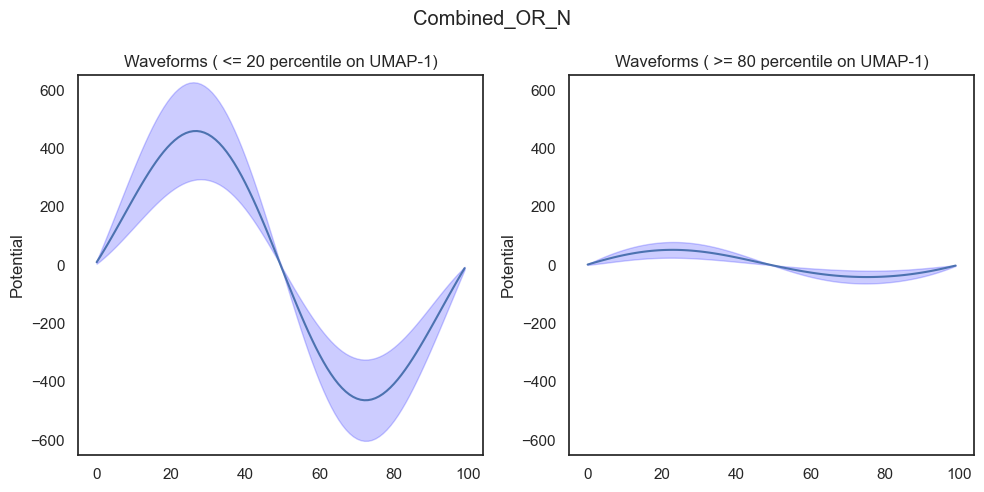

In [30]:
# Average waveforms
plt.figure(figsize=(10,5), facecolor='white')
plt.suptitle("Combined_OR_N")
plt.subplot(1, 2, 1)

means = np.mean(low_waveforms, axis=0)
x_values = np.arange(len(means))
std = np.std(low_waveforms, axis=0)
lower_bound = np.array(means) - np.array(std)
upper_bound = np.array(means) + np.array(std)
sns.lineplot(means)
plt.fill_between(x_values, lower_bound, upper_bound, color='blue', alpha=0.2)
plt.ylabel('Potential')
plt.ylim(-650, 650)
plt.title(f'Waveforms ( <= 20 percentile on UMAP-{component})');

plt.subplot(1, 2, 2)
means = np.mean(high_waveforms, axis=0)
std = np.std(high_waveforms, axis=0)
lower_bound = np.array(means) - np.array(std)
upper_bound = np.array(means) + np.array(std)
sns.lineplot(means)
plt.fill_between(x_values, lower_bound, upper_bound, color='blue', alpha=0.2);
plt.ylabel('Potential')
plt.ylim(-650, 650)
plt.title(f'Waveforms ( >= 80 percentile on UMAP-{component})');
plt.tight_layout()
# plt.savefig(f'./plots_25_09_2024/combined_OR_N_average_waveforms_UMAP-{component}.svg')

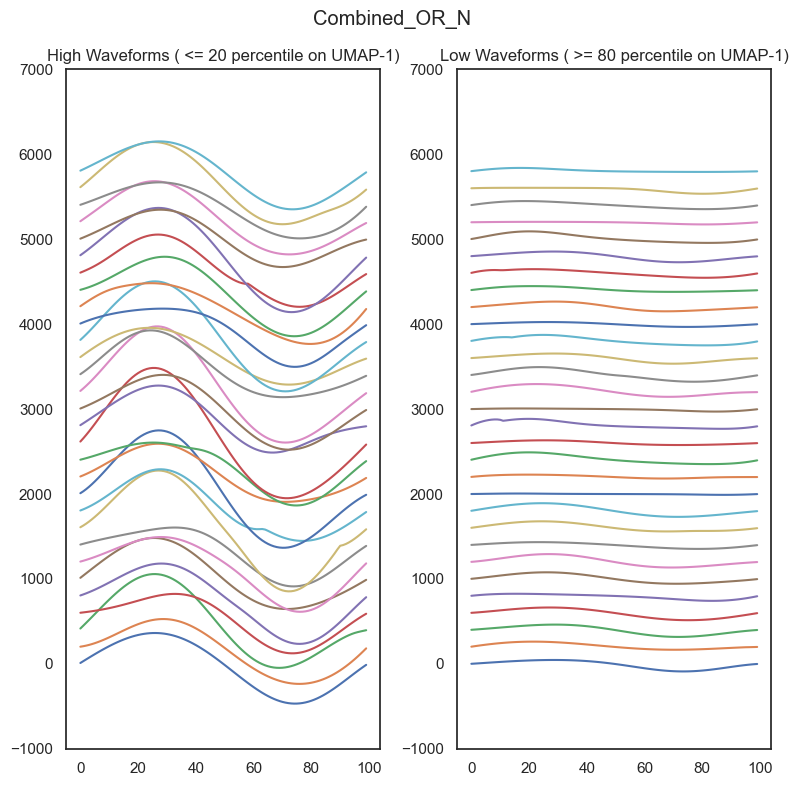

In [31]:
plt.figure(figsize=(8,8), facecolor='white')
plt.suptitle("Combined_OR_N")
plt.subplot(1, 2, 1)
plt.title(f'High Waveforms ( <= 20 percentile on UMAP-{component})')
start = 0
cycles_to_plot = np.random.randint(1, low_waveforms.shape[0], 30)
for i in cycles_to_plot:
  plt.plot(low_waveforms[i,:]+start)
  start += 200
plt.ylim((-1000, 7000))

plt.subplot(1, 2, 2)
plt.title(f'Low Waveforms ( >= 80 percentile on UMAP-{component})')
start = 0
cycles_to_plot = np.random.randint(1, high_waveforms.shape[0], 30)
for i in cycles_to_plot:
  plt.plot(high_waveforms[i,:]+start)
  start += 200
plt.ylim((-1000, 7000))

plt.tight_layout()
# plt.savefig('./plots_25_09_2024/combined_OR_N_extreme_waveforms_UMAP-1.svg')

In [37]:
# !pip install kaleido

In [ ]:
fig = px.density_contour(x=emb[:, 0], y=emb[:, 1], marginal_x="histogram", marginal_y="histogram")
# fig = px.density_contour(x=emb[:, 0], y=emb[:, 1], marginal_x="violin", marginal_y="violin")
# fig.update_traces(contours_coloring="fill", contours_showlabels = True)
fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    xaxis_title="UMAP-1", yaxis_title="UMAP-2"
)
fig.show()
# fig.write_image("./plots_25_09_2024/combined_OR_N_UMAP1&2_histogram.svg")

In [41]:
points = np.zeros((50,4))
points[:, 0] = np.linspace(min(emb[:, 0]), max(emb[:, 0]), 50)
points[:, 1:] = np.mean(emb[:, 1:], axis=0)

umap1_points = embedding.inverse_transform(points)

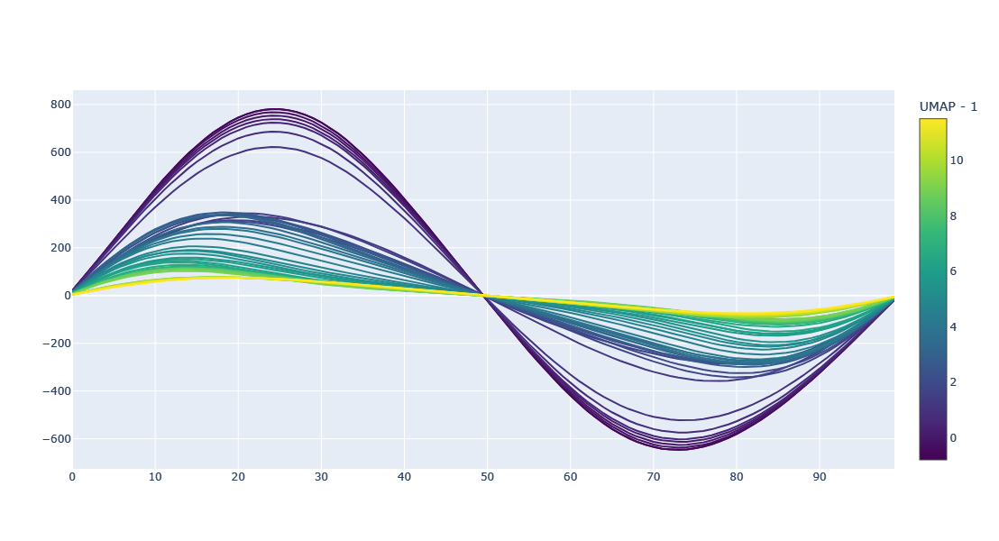

In [45]:
import plotly.graph_objects as go

fig = go.Figure()

x = np.arange(umap1_points.shape[1])
cmap = plt.get_cmap('viridis')

normalized_points = [(val - min(points[:, 0])) / (max(points[:, 0]) - min(points[:, 0])) for val in points[:, 0]]

# Add a line for each row in the 2D array
for i, row in enumerate(umap1_points):
    color = f'rgba{cmap(normalized_points[i])}'
    fig.add_trace(go.Scatter(x=x, y=row, mode='lines', line=dict(color=color, width=2)))

# Add titles and labels
fig.update_layout(
    autosize=False,
    width=600,
    height=600,
    showlegend=False
)

colorbar_trace = go.Scatter(
    x=[None], y=[None],
    mode='markers',
    marker=dict(
        colorscale='Viridis',  # Same colormap used for the lines
        showscale=True,        # Show the color bar
        cmin=min(points[:, 0]),                # Min value for the color bar
        cmax=max(points[:, 0]),      # Max value for the color bar
        colorbar=dict(
            title="UMAP - 1" # Title for the color bar
        )
    ),
    hoverinfo='none'
)

# Add the colorbar trace to the figure
fig.add_trace(colorbar_trace)

# Show the plot
fig.show()
fig.write_image("./plots_25_09_2024/combined_OR_N_UMAP1_waveforms.svg")

In [42]:
random_indexes = np.random.choice(range(len(emb[:,0])), size=10000)

In [ ]:
f, ax = plt.subplots(3,3, figsize=(25,16))

features = ['peak_values','trough_values','duration_samples', 'peak2trough', 'asc2desc', 'peak_position', 'mean_if', 'max_if','range_if']
feature_iter = iter(features)

for r in range(3):
    for c in range(3):
        feature = next(feature_iter)
        s = ax[r,c].scatter(emb[:,2][random_indexes], emb[:,3][random_indexes], c=combined_trials_data[feature].iloc[random_indexes],
            vmin=np.percentile(combined_trials_data[feature].iloc[random_indexes],1),
            vmax=np.percentile(combined_trials_data[feature].iloc[random_indexes],99),
            cmap='coolwarm', s=50)
        ax[r,c].set_xlabel('UMAP-3', fontsize=16)
        ax[r,c].set_ylabel('UMAP-4', fontsize=16)
        ax[r,c].set_title(feature, fontsize=16)
        f.colorbar(s, ax=ax[r,c])

plt.suptitle("OS_basic_combined_OR_N data", fontsize=24);
f.tight_layout()
plt.savefig('./plots_25_09_2024/combined_OR_N_UMAP3&4.png', bbox_inches='tight')
plt.savefig('./plots_25_09_2024/combined_OR_N_UMAP3&4.svg', format='svg', bbox_inches='tight')

In [ ]:
f, ax = plt.subplots(3,3, figsize=(25,16))

features = ['peak_values','trough_values','duration_samples', 'peak2trough', 'asc2desc', 'peak_position', 'mean_if', 'max_if','range_if']
feature_iter = iter(features)

for r in range(3):
    for c in range(3):
        feature = next(feature_iter)
        s = ax[r,c].scatter(emb[:,0], emb[:,1], c=combined_trials_data[feature],
            vmin=np.percentile(combined_trials_data[feature],1),
            vmax=np.percentile(combined_trials_data[feature],99),
            cmap='coolwarm', s=50)
        ax[r,c].set_xlabel('UMAP-1', fontsize=16)
        ax[r,c].set_ylabel('UMAP-2', fontsize=16)
        ax[r,c].set_title(feature, fontsize=16)
        f.colorbar(s, ax=ax[r,c])

plt.suptitle("OS_basic_combined_OR_N data", fontsize=24);
f.tight_layout()
plt.savefig('./plots_25_09_2024/combined_OR_N_UMAP1&2.svg')

In [ ]:
f, ax = plt.subplots(3,3, figsize=(25,16))

features = ['peak_values','trough_values','duration_samples', 'peak2trough', 'asc2desc', 'peak_position', 'mean_if', 'max_if','range_if']
feature_iter = iter(features)

for r in range(3):
    for c in range(3):
        feature = next(feature_iter)
        s = ax[r,c].scatter(emb[:,0], emb[:,2], c=combined_trials_data[feature],
            vmin=np.percentile(combined_trials_data[feature],1),
            vmax=np.percentile(combined_trials_data[feature],99),
            cmap='coolwarm', s=50)
        ax[r,c].set_xlabel('UMAP-1', fontsize=16)
        ax[r,c].set_ylabel('UMAP-3', fontsize=16)
        ax[r,c].set_title(feature, fontsize=16)
        f.colorbar(s, ax=ax[r,c])

plt.suptitle("OS_basic_combined_OR_N data", fontsize=24);
f.tight_layout()
plt.savefig('./plots_25_09_2024/combined_OR_N_UMAP1&3.svg')

In [ ]:
f, ax = plt.subplots(3,3, figsize=(25,16))

features = ['peak_values','trough_values','duration_samples', 'peak2trough', 'asc2desc', 'peak_position', 'mean_if', 'max_if','range_if']
feature_iter = iter(features)

for r in range(3):
    for c in range(3):
        feature = next(feature_iter)
        s = ax[r,c].scatter(emb[:,0], emb[:,3], c=combined_trials_data[feature],
            vmin=np.percentile(combined_trials_data[feature],1),
            vmax=np.percentile(combined_trials_data[feature],99),
            cmap='coolwarm', s=50)
        ax[r,c].set_xlabel('UMAP-1', fontsize=16)
        ax[r,c].set_ylabel('UMAP-4', fontsize=16)
        ax[r,c].set_title(feature, fontsize=16)
        f.colorbar(s, ax=ax[r,c])

plt.suptitle("OS_basic_combined_OR_N data", fontsize=24);
f.tight_layout()
plt.savefig('./plots_25_09_2024/combined_OR_N_UMAP1&4.svg')

In [ ]:
f, ax = plt.subplots(3,3, figsize=(25,16))

features = ['peak_values','trough_values','duration_samples', 'peak2trough', 'asc2desc', 'peak_position', 'mean_if', 'max_if','range_if']
feature_iter = iter(features)

for r in range(3):
    for c in range(3):
        feature = next(feature_iter)
        s = ax[r,c].scatter(emb[:,1], emb[:,2], c=combined_trials_data[feature],
            vmin=np.percentile(combined_trials_data[feature],1),
            vmax=np.percentile(combined_trials_data[feature],99),
            cmap='coolwarm', s=50)
        ax[r,c].set_xlabel('UMAP-2', fontsize=16)
        ax[r,c].set_ylabel('UMAP-3', fontsize=16)
        ax[r,c].set_title(feature, fontsize=16)
        f.colorbar(s, ax=ax[r,c])

plt.suptitle("OS_basic_combined_OR_N data", fontsize=24);
f.tight_layout()
plt.savefig('./plots_25_09_2024/combined_OR_N_UMAP2&3.svg')

In [ ]:
f, ax = plt.subplots(3,3, figsize=(25,16))

features = ['peak_values','trough_values','duration_samples', 'peak2trough', 'asc2desc', 'peak_position', 'mean_if', 'max_if','range_if']
feature_iter = iter(features)

for r in range(3):
    for c in range(3):
        feature = next(feature_iter)
        s = ax[r,c].scatter(emb[:,1], emb[:,3], c=combined_trials_data[feature],
            vmin=np.percentile(combined_trials_data[feature],1),
            vmax=np.percentile(combined_trials_data[feature],99),
            cmap='coolwarm', s=50)
        ax[r,c].set_xlabel('UMAP-2', fontsize=16)
        ax[r,c].set_ylabel('UMAP-4', fontsize=16)
        ax[r,c].set_title(feature, fontsize=16)
        f.colorbar(s, ax=ax[r,c])

plt.suptitle("OS_basic_combined_OR_N data", fontsize=24);
f.tight_layout()
plt.savefig('./plots_25_09_2024/combined_OR_N_UMAP2&4.svg')

In [ ]:
f, ax = plt.subplots(3,3, figsize=(25,16))

features = ['peak_values','trough_values','duration_samples', 'peak2trough', 'asc2desc', 'peak_position', 'mean_if', 'max_if','range_if']
feature_iter = iter(features)

for r in range(3):
    for c in range(3):
        feature = next(feature_iter)
        s = ax[r,c].scatter(emb[:,2], emb[:,3], c=combined_trials_data[feature],
            vmin=np.percentile(combined_trials_data[feature],1),
            vmax=np.percentile(combined_trials_data[feature],99),
            cmap='coolwarm', s=50)
        ax[r,c].set_xlabel('UMAP-3', fontsize=16)
        ax[r,c].set_ylabel('UMAP-4', fontsize=16)
        ax[r,c].set_title(feature, fontsize=16)
        f.colorbar(s, ax=ax[r,c])

plt.suptitle("OS_basic_combined_OR_N data", fontsize=24);
f.tight_layout()
plt.savefig('./plots_25_09_2024/combined_OR_N_UMAP3&4.svg')

In [ ]:
from plotly.graph_objs.layout import Scene
from plotly.graph_objs.layout.scene import XAxis, YAxis, ZAxis

fig = px.scatter_3d(x=emb[:,0], y=emb[:,1], z=emb[:,2],
              color=combined_trials_data['peak_values'])
fig.update_layout(coloraxis_colorbar_title_text = 'peak_values',
                 autosize=False,
                 width=800,
                 height=800,
                 scene=Scene(xaxis=XAxis(title='UMAP-1'),
                            yaxis=YAxis(title='UMAP-2'),
                            zaxis=ZAxis(title='UMAP-3')))

fig.show()

In [53]:
import plotly.io as pio

# Number of frames for the movie
frames = 180
# Angle of rotation per frame (in radians)
angle_increment = 2 * np.pi / frames

# Set the initial camera view
camera = dict(
    eye=dict(x=2, y=2, z=2)  # Adjust this initial position as needed
)

# Create a directory to save images if not already present
import os
os.makedirs("rotation_frames", exist_ok=True)

In [54]:
for i in range(frames):
    angle = i * angle_increment
    camera['eye']['x'] = 2 * np.cos(angle)
    camera['eye']['y'] = 2 * np.sin(angle)
    
    fig.update_layout(scene_camera=camera)
    
    # Save each frame as an image
    pio.write_image(fig, f"rotation_frames/frame_{i:03d}.png")

In [ ]:
import cv2
import os

image_folder = 'rotation_frames'
video_name = '180_video.avi'

images = [img for img in os.listdir(image_folder) if img.endswith(".png")]
frame = cv2.imread(os.path.join(image_folder, images[0]))
height, width, layers = frame.shape

video = cv2.VideoWriter(video_name, 0, 25, (width,height))

for image in images:
    video.write(cv2.imread(os.path.join(image_folder, image)))

cv2.destroyAllWindows()
video.release()

# Time of cycle

In [339]:
all_orn_data.keys()

dict_keys(['ORN1_trials', 'ORN1_waveforms', 'ORN3_trials', 'ORN3_waveforms', 'ORN4_trials', 'ORN4_waveforms', 'ORN6_trials', 'ORN6_waveforms', 'ORN13_trials', 'ORN13_waveforms'])

In [341]:
def fun(row, cycle_vector, fs):
    return (np.where(cycle_vector == row.name)[0][0])/fs